In [1]:
import numpy as np
from ScanImageTiffReader import ScanImageTiffReader
import napari
import pickle

In [2]:
from skimage import data
from scipy import stats
from scipy import signal
from tifffile import tifffile
from os.path import sep
from matplotlib import pyplot as plt
import math
import matplotlib.colors as colors
import xarray as xr
import pandas as pd
import seaborn as sns
import json
import os
from scipy.ndimage import gaussian_filter1d

In [3]:
import SessionTools.two_photon as st2p

In [4]:
from fly2p_function_TQ.imaging_2p_preprocessing import combine_single_tiff, computeMotionShift, motionCorrection, low_pass_filter_TQ, high_pass_filter_TQ, averaging_frame,combine_single_tiff_ch1
from fly2p_function_TQ.imaging_2p_preprocessing import combine_PB_corresponding_ROI,get_raw_F,get_dff_array, normalizing_dff_array, combine_single_tiff_V2, combine_EB_corresponding_ROI
from fly2p_function_TQ.imaging_2p_PVA_functions import PVA_radian_calcul, PVAangleToRoi, PVA_radian_to_angle, PVA_angle_to_radian, calcualteBumpAmplitude,pol2cart
from fly2p_function_TQ.imaging_2p_fictrac_imaging_alignment import downsample_heading_to_total_volume, offset_calculation,fictrack_signal_decoding,moving_wrapped_plot_by_offset
from fly2p_function_TQ.imaging_2p_fixed_heading_period_analysis import find_stop_period_on_heading

In [5]:
#Just used for reading single tiff file
#image = tifffile.imread("/home/tianhaoqiu/Documents/GitHub/2p_analysis/combine_TSeries-60D05-GCaMP8s-TSeries-11242022-1355-009.tiff")
#print(image.shape)

In [6]:
# Some key parameters for imaging analysis (for futuure should come from direct reading of metadata file)
volume_cycle = 3038
volume_time = 0.09875
volume_rate = 1/volume_time
slice_per_volume = 10
fictrack_sampling_rate = 50000

# 1 for cl, 0 for dark trial
trial_type = 0

# 1 for PB, 0 for EB, 2 for FB 
brain_region = 2

#1 for yes, 0 for no
dual_imaging = 0
bar_jumping = 0

In [7]:
time_array_imaging = np.arange(volume_cycle)/volume_rate

In [8]:
image_data_combined, tiff_file_sequence = combine_single_tiff(slice_num = slice_per_volume, cycle_num = volume_cycle, file_dir = '/home/tianhaoqiu/Desktop/TQfly432-003')

if dual_imaging == 1:
    image_data_combined_2, tiff_file_sequence_2 = combine_single_tiff_ch1(slice_num = slice_per_volume, cycle_num = volume_cycle, file_dir = '/home/tianhaoqiu/Desktop/TQfly353-002')
    image_2 = image_data_combined_2
image = image_data_combined
image.shape

(3038, 10, 134, 393)

In [9]:
imgStack = xr.DataArray(image,dims = ['volumes [s]', 'planes [µm]', 'xpix [µm]', 'ypix [µm]'])

if dual_imaging == 1:
    imgStack_2 = xr.DataArray(image_2,dims = ['volumes [s]', 'planes [µm]', 'xpix [µm]', 'ypix [µm]'])

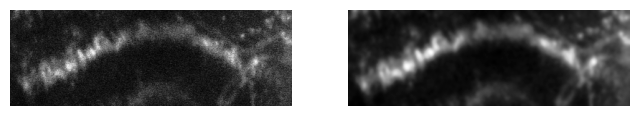

In [10]:
## Motion Correction setup
# Set reference image
stackMP = np.max(imgStack, axis=1) # max projection over volume
# Generate reference image
reference_num = np.int_(np.round(0.1 * volume_cycle))
refImg = np.mean(stackMP[0:reference_num,:,:],axis=0)

if dual_imaging == 1:
    stackMP_2 = np.max(imgStack_2, axis=1) # max projection over volume
    # Generate reference image
    reference_num = np.int_(np.round(0.1 * volume_cycle))
    refImg_2 = np.mean(stackMP_2[0:reference_num,:,:],axis=0)

from scipy.ndimage import gaussian_filter
refImgFilt = gaussian_filter(refImg, sigma=2)

fig, axs = plt.subplots(1,2,figsize=(8,4))
axs[0].imshow(refImg,cmap='Greys_r', origin='lower'); axs[0].axis('off');
axs[1].imshow(refImgFilt,cmap='Greys_r', origin='lower'); axs[1].axis('off');


In [11]:
if dual_imaging == 1:
    shift_2 = computeMotionShift(stackMP_2, refImg_2, 10, 2, doFilter=False, stdFactor=4, showShiftFig=True)    

perform motion correction on a single plane/max projection


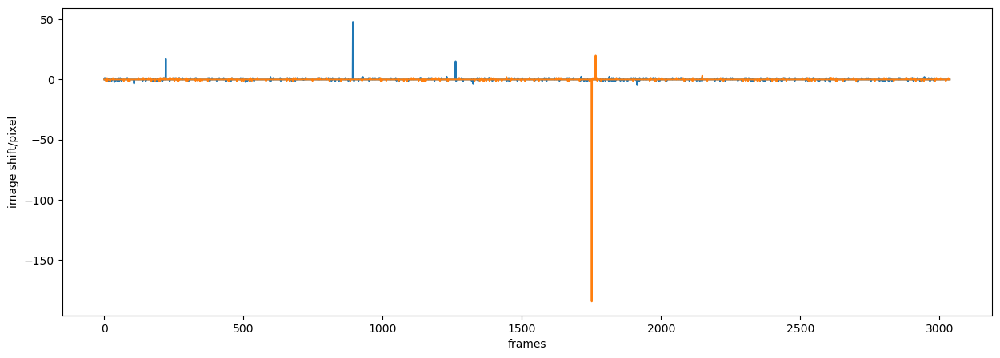

In [12]:
shift = computeMotionShift(stackMP, refImg, 10, 2, doFilter=False, stdFactor=4, showShiftFig=True)    

In [13]:
stack4dMC = motionCorrection(imgStack, shift)

In [14]:
if dual_imaging == 1:
    stack4dMC_2 = motionCorrection(imgStack_2, shift_2)

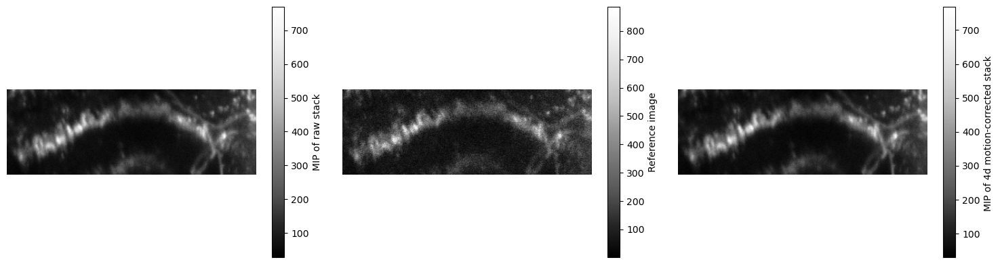

In [15]:
fig, axs = plt.subplots(1,3,figsize=(15,4))
cb = axs[0].imshow(imgStack.max(axis=1).mean(axis=0),cmap='Greys_r', origin='lower')
plt.colorbar(cb, ax=axs[0], label='MIP of raw stack')
axs[0].axis('off');
cb = axs[1].imshow(refImg,cmap='Greys_r', origin='lower')
plt.colorbar(cb, ax=axs[1], label='Reference image')
axs[1].axis('off');
cb = axs[2].imshow(stack4dMC.max(axis=1).mean(axis=0),cmap='Greys_r', origin='lower')
plt.colorbar(cb, ax=axs[2], label='MIP of 4d motion-corrected stack ')
axs[2].axis('off');
fig.tight_layout()

In [16]:
#viewer.layers.save('my_file.csv')

In [17]:
stack4dMC.shape

(3038, 10, 134, 393)

In [18]:
stack4dMCTEST = np.expand_dims(stack4dMC, axis =0)
imgStack_napari = np.expand_dims(imgStack, axis =0)
if dual_imaging == 1:
    imgStack_napari_2 = np.expand_dims(imgStack_2, axis =0)

In [19]:
stack4dMCTEST.shape

(1, 3038, 10, 134, 393)

In [20]:
# Use this for EB roi
if brain_region == 0:
    ebnapari = st2p.preprocessing.napari_tools.EllipsoidBodySession().new_session(imgStack_napari.mean(axis=1))
# Use this for PB roi
else:
    viewer = napari.Viewer()
    new_layer = viewer.add_image(imgStack_napari.mean(axis=1))
    #viewer.dims.ndisplay = 3

In [21]:
if dual_imaging == 1:
    viewer = napari.Viewer()
    new_layer = viewer.add_image(imgStack_napari_2.mean(axis=1))

In [22]:
if brain_region == 0:
    ebnapari.make_phase_masks()

In [23]:
#if brain_region == 1:
    #from tifffile import imsave
    #imsave('combine_TQfly052-008.tiff',imgStack)

In [78]:
label = tifffile.imread("/home/tianhaoqiu/Documents/GitHub/2p_analysis/napari_roi/delta7_imaging_shi_experiment/delta7_6f_shi/R55G08_6f_+/TQfly432/ROI_1_TQfly432-001.tif")
if dual_imaging == 1:
    label_2 = tifffile.imread("/home/tianhaoqiu/Documents/GitHub/2p_analysis/napari_roi/dual_imaging/55G08_syt7f_27F02_jRGECO1a(bar jumping)/TQfly353/ROI_16_TQfly353-002_EPG.tif")
#viewer.add_labels(label, name='Labels_16_Roi)

In [79]:
#Load ROI and label from napari
#napari_roi_16 = viewer.layers['Labels_16_Roi'].data
if brain_region == 0: 
    napari_roi = label
    if dual_imaging == 1:
        napari_roi_2 = label_2
else:
    #napari_roi = label[0,:,:,:]
    #Start from TQfly081, easier way to save ROI
    napari_roi = np.squeeze(label , axis=0) 
    if dual_imaging == 1:
        napari_roi_2 = np.squeeze(label_2 , axis=0) 

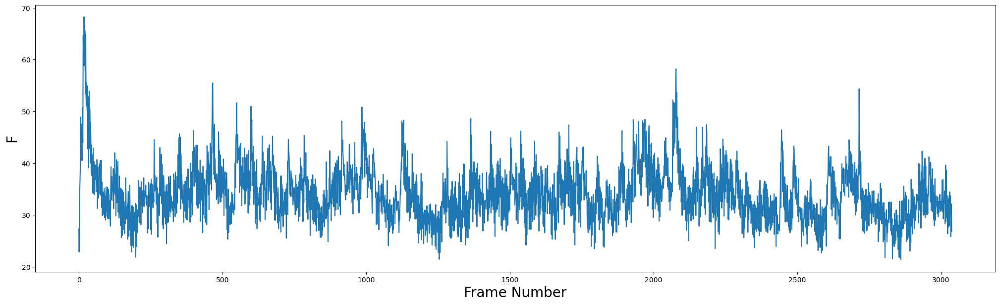

In [80]:
ROI_total = 1
F_array = get_raw_F(ROI_total, napari_roi, imgStack)
if dual_imaging == 1:
    F_array_2 = get_raw_F(ROI_total, napari_roi_2, imgStack_2)

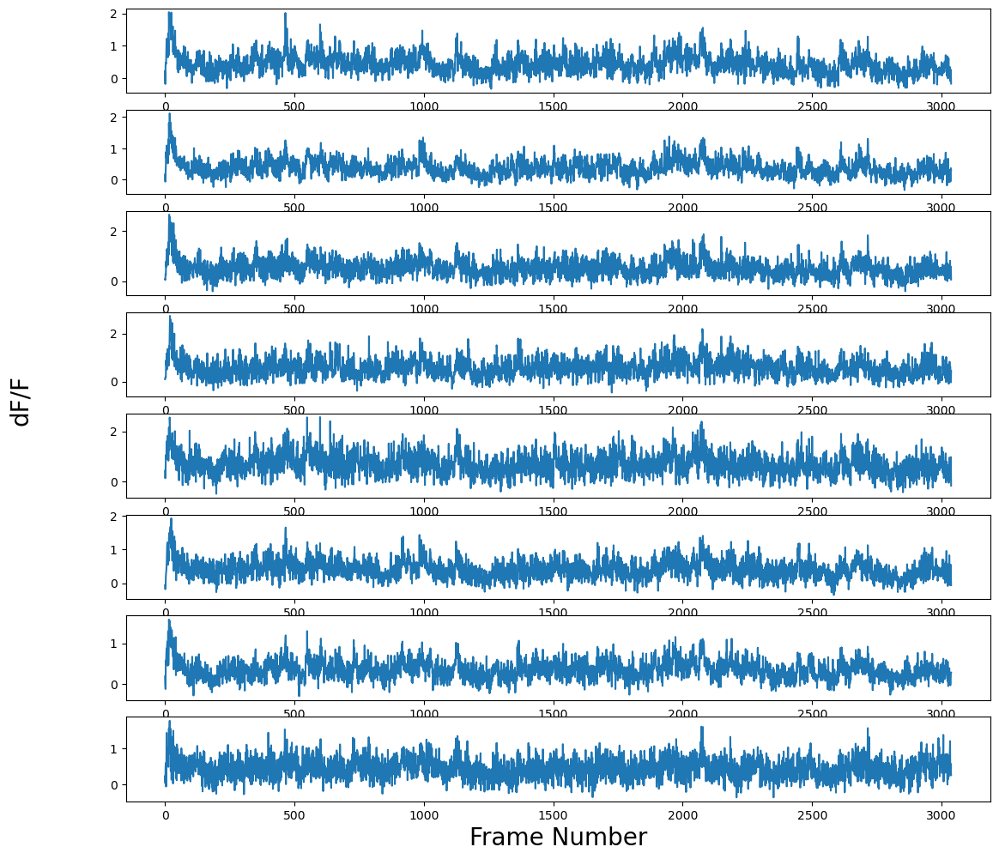

In [24]:
dF_F_array = get_dff_array(raw_F_array = F_array, ROI_num = ROI_total, F_zero_cutoff = 0.05)

if dual_imaging == 1:
    dF_F_array_2 = get_dff_array(raw_F_array = F_array_2, ROI_num = ROI_total, F_zero_cutoff = 0.05)

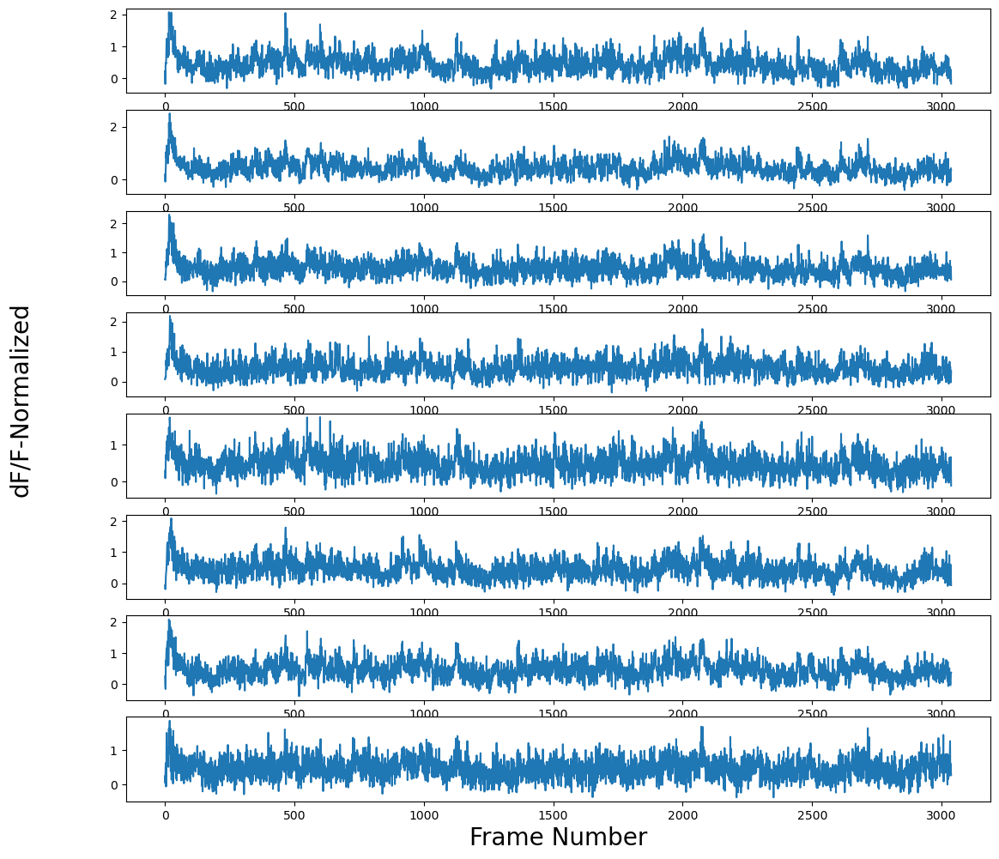

In [25]:
dF_F_array_normalized = normalizing_dff_array(dF_F_array,ROI_num= ROI_total, normalize_cutoff= 0.95)

if dual_imaging == 1:
    dF_F_array_normalized_2 = normalizing_dff_array(dF_F_array_2,ROI_num= ROI_total, normalize_cutoff= 0.95)

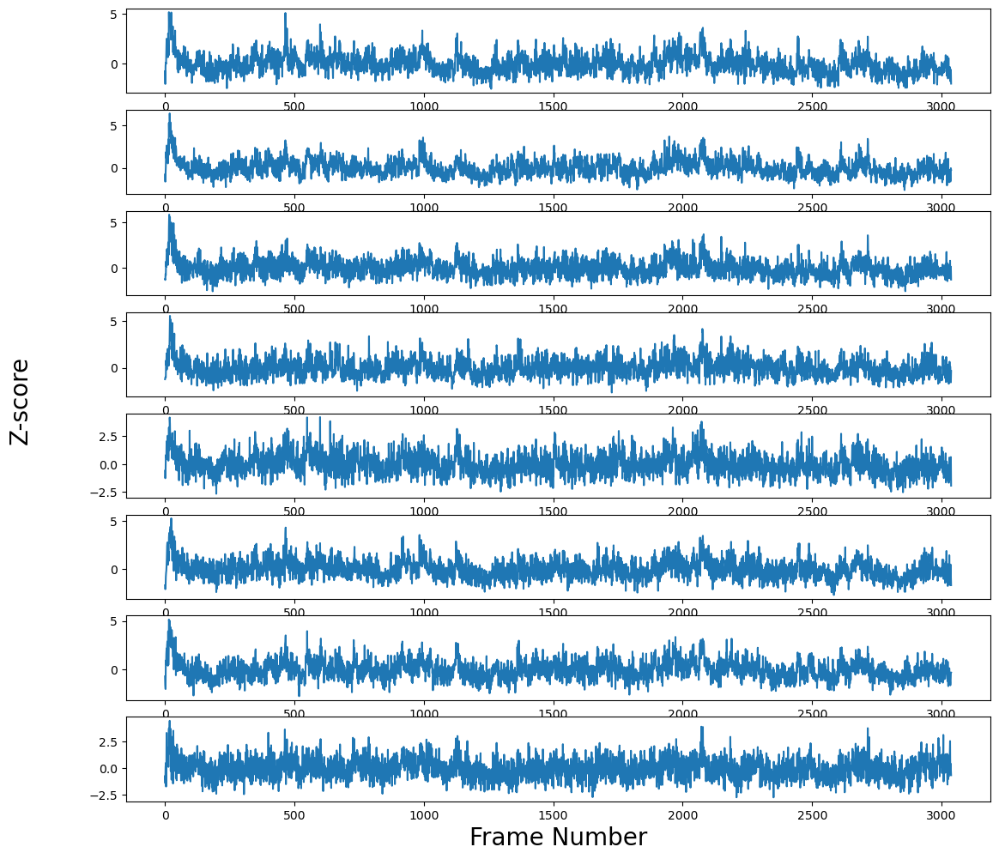

In [26]:
# Z-score: alternative way to calculate df/f
Z_score_array = np.zeros((imgStack['volumes [s]'].size, ROI_total))
F_sd = np.std(F_array, axis = 0)
F_mean = np.mean(F_array, axis = 0)
for z_index in range(ROI_total):
    Z_score_array [:,z_index] = (F_array[:,z_index] - F_mean[z_index])/F_sd[z_index]

fig, axs = plt.subplots(ROI_total, 1, figsize=(13, 12))
for i in range(ROI_total):
    ax = axs[i]
    ax.plot(Z_score_array [:,i])
fig.supylabel('Z-score',fontsize=20)
plt.xlabel('Frame Number', fontsize=20)
plt.show()

if dual_imaging == 1:
    Z_score_array_2 = np.zeros((imgStack['volumes [s]'].size, ROI_total))
    F_sd_2 = np.std(F_array_2, axis = 0)
    F_mean_2 = np.mean(F_array_2, axis = 0)
    for z_index in range(ROI_total):
        Z_score_array_2 [:,z_index] = (F_array_2[:,z_index] - F_mean_2[z_index])/F_sd_2[z_index]

In [27]:
#Median_filtering the normalized df_f trace
for i in range (ROI_total):
    dF_F_array_normalized[:,i] = signal.medfilt(dF_F_array_normalized[:,i],kernel_size =3)
    Z_score_array [:,i] = signal.medfilt(Z_score_array [:,i],kernel_size =3)
    
if dual_imaging == 1:
    for i in range (ROI_total):
        dF_F_array_normalized_2[:,i] = signal.medfilt(dF_F_array_normalized_2[:,i],kernel_size =3)
        Z_score_array_2[:,i] = signal.medfilt(Z_score_array_2[:,i],kernel_size =3)
    

In [28]:
#Create a correlation matrix to look at the correlation between corresponding golemuruli in left/right PB
if ROI_total == 16:
    df_f_dataframe_normalized = pd.DataFrame(dF_F_array_normalized, columns=['L8', 'L7', 'L6','L5','L4','L3','L2','L1','R1','R2','R3','R4','R5','R6','R7','R8'])
    #df_f_dataframe_normalized = pd.DataFrame(dF_F_array_normalized, columns=['L8', 'L7', 'L6','L5','L4','L3','L2','L9','R9','R2','R3','R4','R5','R6','R7','R8'])
    correlation_matrix_df_f = df_f_dataframe_normalized.corr()
    plt.figure(figsize= (5,5))
    sns.heatmap(correlation_matrix_df_f)
    plt.xlabel('ROI Id', fontsize=10)
    plt.ylabel('ROI Id', fontsize=10)
    plt.title('dF/F-normalized Corerelation Matrix', fontsize=15)
    
    if dual_imaging == 1:
        df_f_dataframe_normalized = pd.DataFrame(dF_F_array_normalized_2, columns=['L8', 'L7', 'L6','L5','L4','L3','L2','L1','R1','R2','R3','R4','R5','R6','R7','R8'])
        #df_f_dataframe_normalized = pd.DataFrame(dF_F_array_normalized, columns=['L8', 'L7', 'L6','L5','L4','L3','L2','L9','R9','R2','R3','R4','R5','R6','R7','R8'])
        correlation_matrix_df_f = df_f_dataframe_normalized.corr()
        plt.figure(figsize= (5,5))
        sns.heatmap(correlation_matrix_df_f)
        plt.xlabel('ROI Id', fontsize=10)
        plt.ylabel('ROI Id', fontsize=10)
        plt.title('dF/F-normalized Corerelation Matrix', fontsize=15)
    plt.show()
    
    

In [29]:
if ROI_total == 8:
    F_8_roi = F_array
    dF_F_array_8_roi = dF_F_array
    dF_F_array_8_roi_normalized = dF_F_array_normalized
    Z_score_array_8_roi = Z_score_array
    ROI_number_combined  = 8

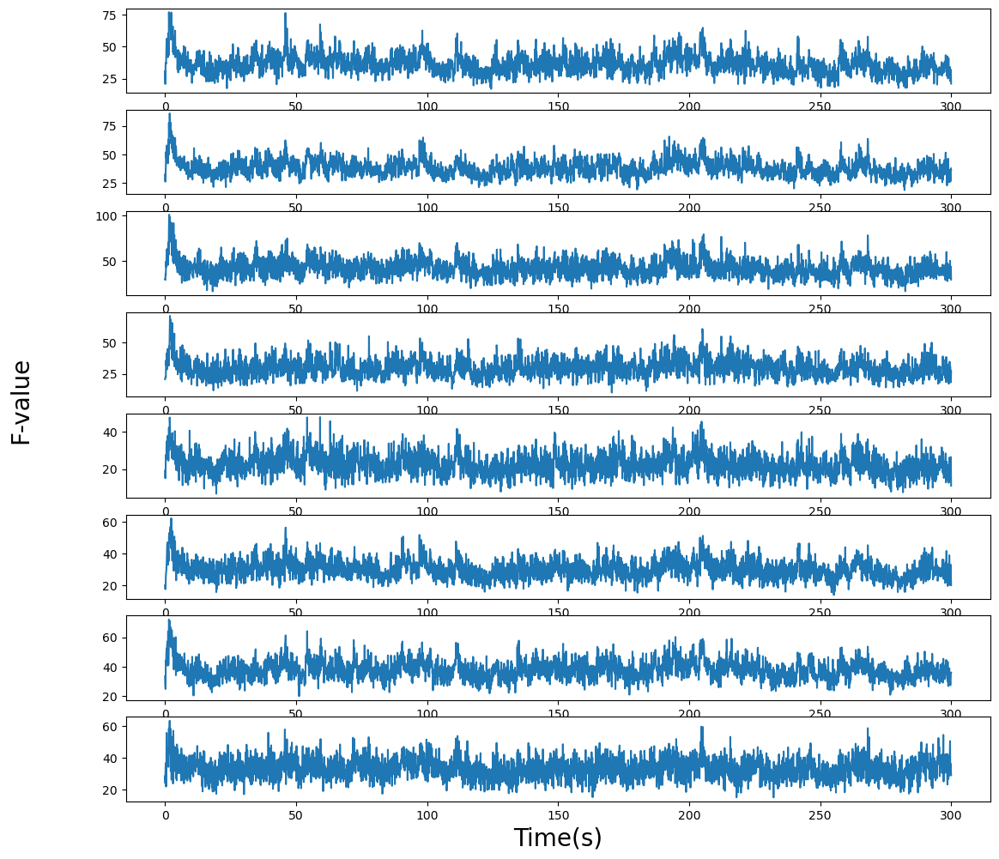

In [30]:
#mode 1 for EPG and PEG
#Rule of combination: L1+R1 (Label in napari 8,9), L8+R2(1,10), L7+R3 (2,11), L6+R4(3,12), L5+R5(4,13), L4+R6(5,14)
#L3+R7(6,15), L2+R8(7,16)

#mode 1 also for PEN2
#for napari ROI, everything same except L9 and R9 corresboding to napari ROP 8,9
if brain_region == 0:
    F_8_roi = combine_EB_corresponding_ROI(dff_array_input = F_array, napari_ROI = napari_roi , ROI_num = 8, mode = 1, time_array_imaging = time_array_imaging)

#PB
elif brain_region == 1:
    F_8_roi = combine_PB_corresponding_ROI(dff_array_input = F_array, napari_ROI = napari_roi , ROI_num = 8, mode =2, time_array_imaging = time_array_imaging)
    if dual_imaging == 1:
        F_8_roi_2 = combine_PB_corresponding_ROI(dff_array_input = F_array_2, napari_ROI = napari_roi_2 , ROI_num = 8, mode = 1, time_array_imaging = time_array_imaging)
ROI_number_combined = 8
fig, axs = plt.subplots(ROI_number_combined, 1, figsize=(13, 12))
for i in range(ROI_number_combined):
    ax = axs[i]
    ax.plot(time_array_imaging,F_8_roi[:,i])
fig.supylabel('F-value',fontsize=20)
plt.xlabel('Time(s)', fontsize=20)
plt.show()

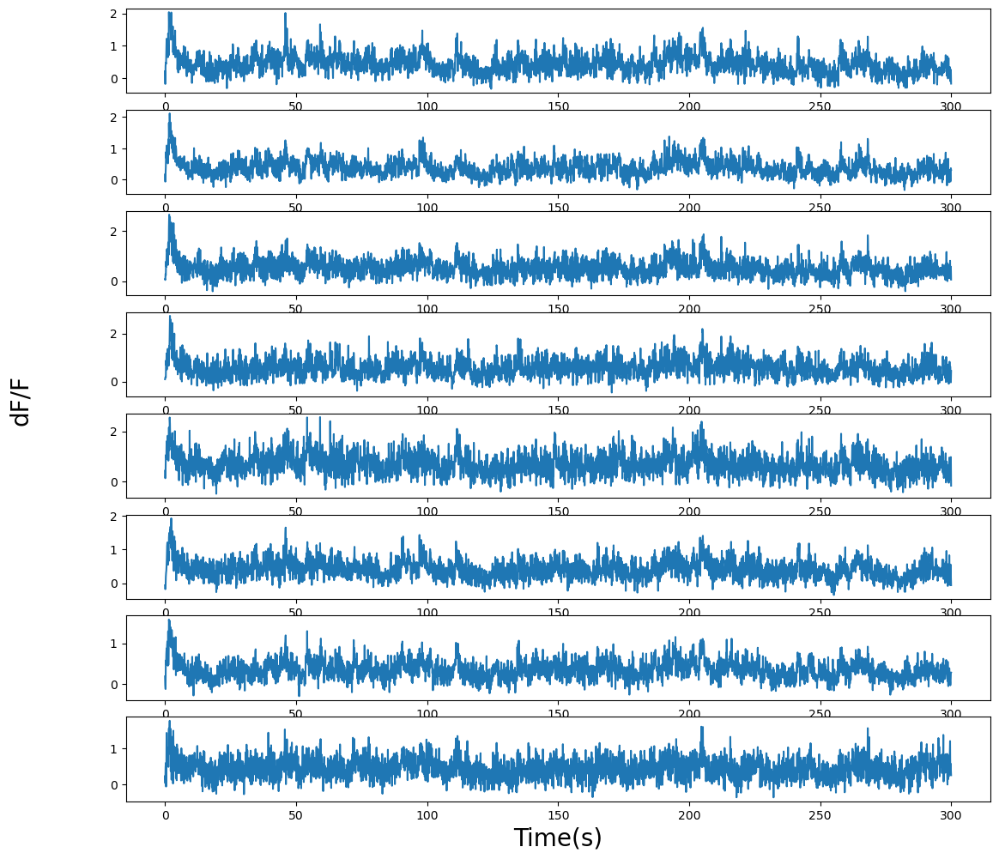

In [31]:
#mode 1 for EPG and PEG
#Rule of combination: L1+R1 (Label in napari 8,9), L8+R2(1,10), L7+R3 (2,11), L6+R4(3,12), L5+R5(4,13), L4+R6(5,14)
#L3+R7(6,15), L2+R8(7,16)

if brain_region == 0:
    dF_F_array_8_roi = combine_EB_corresponding_ROI(dff_array_input = dF_F_array, napari_ROI = napari_roi , ROI_num = 8, mode = 1, time_array_imaging = time_array_imaging)

elif brain_region == 1:
    dF_F_array_8_roi = combine_PB_corresponding_ROI(dff_array_input = dF_F_array, napari_ROI = napari_roi , ROI_num = 8, mode = 2, time_array_imaging = time_array_imaging)
    if dual_imaging == 1:
        dF_F_array_8_roi_2 = combine_PB_corresponding_ROI(dff_array_input = dF_F_array_2, napari_ROI = napari_roi_2 , ROI_num = 8, mode = 1, time_array_imaging = time_array_imaging)
ROI_number_combined = 8
fig, axs = plt.subplots(ROI_number_combined, 1, figsize=(13, 12))
for i in range(ROI_number_combined):
    ax = axs[i]
    ax.plot(time_array_imaging, dF_F_array_8_roi[:,i])
fig.supylabel('dF/F',fontsize=20)
plt.xlabel('Time(s)', fontsize=20)
plt.show()

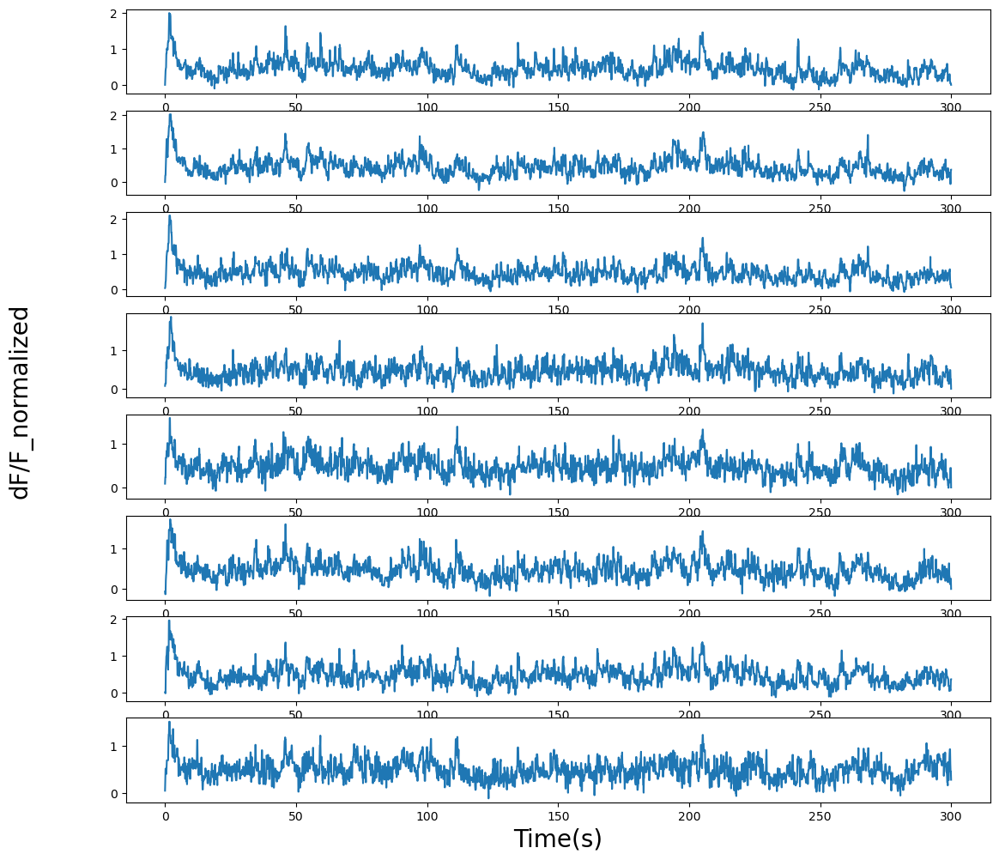

In [32]:
#mode 1 for EPG and PEG
#Rule of combination: L1+R1 (Label in napari 8,9), L8+R2(1,10), L7+R3 (2,11), L6+R4(3,12), L5+R5(4,13), L4+R6(5,14)
#L3+R7(6,15), L2+R8(7,16)

if brain_region == 0:
    dF_F_array_8_roi_normalized = combine_EB_corresponding_ROI(dff_array_input = dF_F_array_normalized, napari_ROI = napari_roi , ROI_num = 8, mode = 1, time_array_imaging = time_array_imaging)
elif brain_region == 1:
    dF_F_array_8_roi_normalized = combine_PB_corresponding_ROI(dff_array_input = dF_F_array_normalized, napari_ROI = napari_roi , ROI_num = 8, mode = 2, time_array_imaging = time_array_imaging)
    if dual_imaging == 1:
        dF_F_array_8_roi_normalized_2 = combine_PB_corresponding_ROI(dff_array_input = dF_F_array_normalized_2, napari_ROI = napari_roi_2 , ROI_num = 8, mode = 1, time_array_imaging = time_array_imaging)
ROI_number_combined = 8
fig, axs = plt.subplots(ROI_number_combined, 1, figsize=(13, 12))
for i in range(ROI_number_combined):
    ax = axs[i]
    ax.plot(time_array_imaging, dF_F_array_8_roi_normalized[:,i])
fig.supylabel('dF/F_normalized',fontsize=20)
plt.xlabel('Time(s)', fontsize=20)
plt.show()

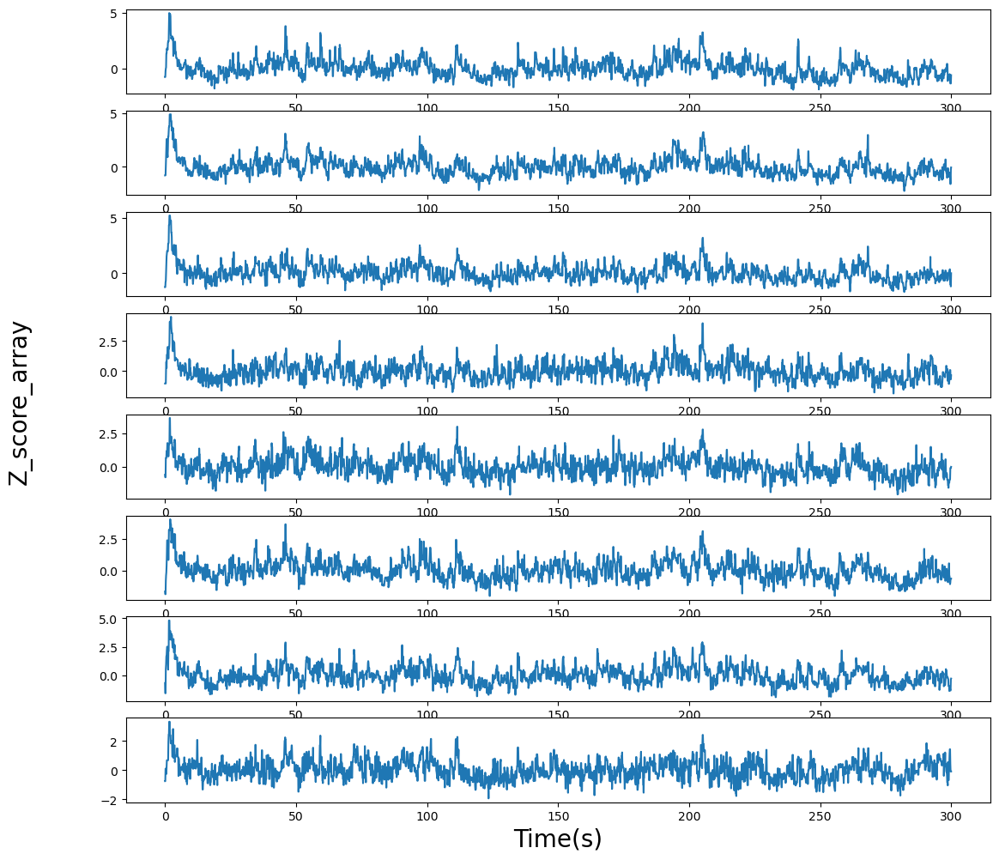

In [33]:
if brain_region == 0:
    Z_score_array_8_roi = combine_EB_corresponding_ROI(dff_array_input = Z_score_array, napari_ROI = napari_roi , ROI_num = 8, mode = 1, time_array_imaging = time_array_imaging)
elif brain_region == 1:
    Z_score_array_8_roi = combine_PB_corresponding_ROI(dff_array_input = Z_score_array, napari_ROI = napari_roi , ROI_num = 8, mode = 2, time_array_imaging = time_array_imaging)
    if dual_imaging == 1:
        Z_score_array_8_roi_2 = combine_PB_corresponding_ROI(dff_array_input = Z_score_array_2, napari_ROI = napari_roi_2 , ROI_num = 8, mode = 1, time_array_imaging = time_array_imaging)
ROI_number_combined = 8
fig, axs = plt.subplots(ROI_number_combined, 1, figsize=(13, 12))
for i in range(ROI_number_combined):
    ax = axs[i]
    ax.plot(time_array_imaging, Z_score_array_8_roi[:,i])
fig.supylabel('Z_score_array',fontsize=20)
plt.xlabel('Time(s)', fontsize=20)
plt.show()

In [34]:
PVA_radian_array, PVA_strength = PVA_radian_calcul(dF_F_array_8_roi, imgStack['volumes [s]'].size,ROI_number_combined )
PVA_radian_array_normalized, PVA_strength_normalized = PVA_radian_calcul(dF_F_array_8_roi_normalized, imgStack['volumes [s]'].size,ROI_number_combined)
PVA_radian_array_z, PVA_strength_z_scored = PVA_radian_calcul(Z_score_array_8_roi, imgStack['volumes [s]'].size,ROI_number_combined)

In [35]:
if dual_imaging == 1:
    PVA_radian_array_2, PVA_strength_2 = PVA_radian_calcul(dF_F_array_8_roi_2, imgStack['volumes [s]'].size,ROI_number_combined )
    PVA_radian_array_normalized_2, PVA_strength_normalized_2 = PVA_radian_calcul(dF_F_array_8_roi_normalized_2, imgStack['volumes [s]'].size,ROI_number_combined)
    PVA_radian_array_z_2, PVA_strength_z_scored_2 = PVA_radian_calcul(Z_score_array_8_roi_2, imgStack['volumes [s]'].size,ROI_number_combined)

In [36]:
PVA_angle_Array = PVA_radian_to_angle(PVA_radian_array)
PVA_angle_Array_normalized = PVA_radian_to_angle(PVA_radian_array_normalized)
PVA_angle_array_z = PVA_radian_to_angle(PVA_radian_array_z)

In [37]:
if dual_imaging == 1:
    PVA_angle_Array_2 = PVA_radian_to_angle(PVA_radian_array_2)
    PVA_angle_Array_normalized_2 = PVA_radian_to_angle(PVA_radian_array_normalized_2)
    PVA_angle_array_z_2 = PVA_radian_to_angle(PVA_radian_array_z_2)

In [38]:
if ROI_total == 16:
    PVA_radian_array_normalized_16, PVA_strength_normalized_16 = PVA_radian_calcul(dF_F_array_normalized, imgStack['volumes [s]'].size, 16)
    PVA_angle_Array_normalized_16  = PVA_radian_to_angle(PVA_radian_array_normalized_16 )

In [39]:
PVA_ROI_assigned = PVAangleToRoi(PVA_angle_Array)
PVA_ROI_assigned_normalized = PVAangleToRoi(PVA_angle_Array_normalized)
PVA_ROI_assigned_z = PVAangleToRoi(PVA_angle_array_z)

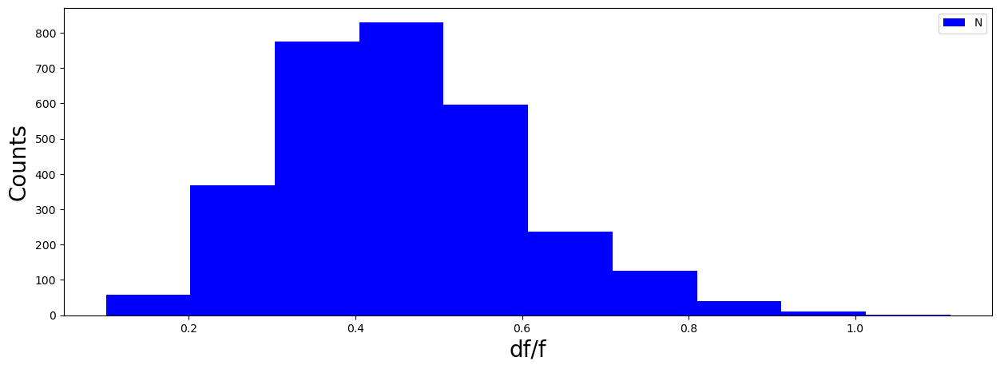

In [40]:
bump_amplitude_dff = calcualteBumpAmplitude(dF_F_array_8_roi)
bump_amplitude_dff_normalized = calcualteBumpAmplitude(dF_F_array_8_roi_normalized)
if dual_imaging == 1:
    bump_amplitude_dff_normalized_2 = calcualteBumpAmplitude(dF_F_array_8_roi_normalized_2)
plt.figure(figsize=(15,5))
#plt.hist(bump_amplitude_dff_normalized_2, color ='r')
plt.hist(bump_amplitude_dff_normalized, color ='b')
plt.legend('Normalized')

plt.ylabel('Counts',fontsize=20)
plt.xlabel('df/f', fontsize=20)
plt.show()

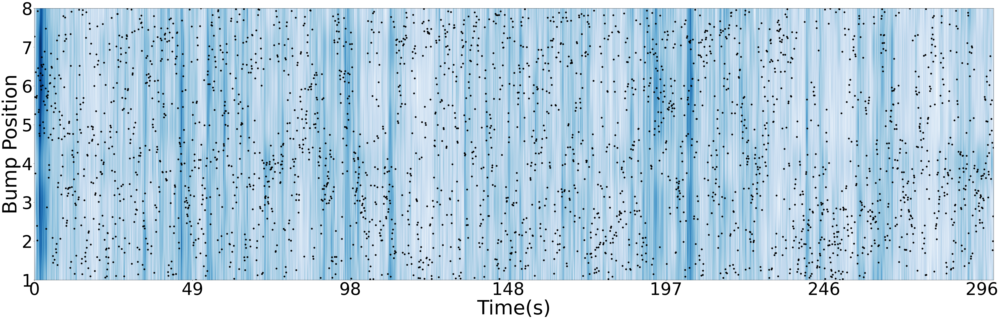

In [41]:
#Plot heatmap of signals in combined ROI and superimpose with PVA
df_dff_in_ROI_normalized = dF_F_array_8_roi_normalized.transpose()
df_dff_in_ROI_normalized_shifted = np.zeros((np.size(df_dff_in_ROI_normalized,0),np.size(df_dff_in_ROI_normalized,1)))
df_dff_in_ROI_normalized_shifted[0,:] = df_dff_in_ROI_normalized[4,:]
df_dff_in_ROI_normalized_shifted[1,:] = df_dff_in_ROI_normalized[5,:]
df_dff_in_ROI_normalized_shifted[2,:] = df_dff_in_ROI_normalized[6,:]
df_dff_in_ROI_normalized_shifted[3,:] = df_dff_in_ROI_normalized[7,:] 
df_dff_in_ROI_normalized_shifted[4,:] = df_dff_in_ROI_normalized[0,:] 
df_dff_in_ROI_normalized_shifted[5,:] = df_dff_in_ROI_normalized[1,:] 
df_dff_in_ROI_normalized_shifted[6,:] = df_dff_in_ROI_normalized[2,:] 
df_dff_in_ROI_normalized_shifted[7,:] = df_dff_in_ROI_normalized[3,:]
df_dff_in_ROI_normalized_shifted_for_plotting_part = df_dff_in_ROI_normalized_shifted
df_dff_in_ROI_normalized_shifted = pd.DataFrame(df_dff_in_ROI_normalized_shifted)
plt.figure(figsize= (70,20))
plt.imshow(df_dff_in_ROI_normalized_shifted, aspect= 'auto', cmap = 'Blues')
plt.xlabel('Time(s)', fontsize=80)
plt.ylabel('Bump Position', fontsize=80)
plt.xticks(ticks=plt.xticks()[0][0:], labels=np.array(plt.xticks()[0][0:]/volume_rate, dtype=np.int64), fontsize =70)
plt.yticks(ticks=plt.yticks()[0][0:], labels=np.array(plt.yticks()[0][0:]+1, dtype=np.int64), fontsize=70)
plt.ylim(0,7)
plt.locator_params(axis ='x',nbins = 20)
plt.scatter(np.arange(len(PVA_angle_Array_normalized)),7*(PVA_angle_Array_normalized+180)/2/180, color ='black', s = 40)
plt.show()

In [42]:
#Plot heatmap of signals in combined ROI and superimpose with PVA
if dual_imaging == 1:
    df_dff_in_ROI_normalized_2 = dF_F_array_8_roi_normalized_2.transpose()
    df_dff_in_ROI_normalized_shifted_2 = np.zeros((np.size(df_dff_in_ROI_normalized_2,0),np.size(df_dff_in_ROI_normalized_2,1)))
    df_dff_in_ROI_normalized_shifted_2[0,:] = df_dff_in_ROI_normalized_2[4,:]
    df_dff_in_ROI_normalized_shifted_2[1,:] = df_dff_in_ROI_normalized_2[5,:]
    df_dff_in_ROI_normalized_shifted_2[2,:] = df_dff_in_ROI_normalized_2[6,:]
    df_dff_in_ROI_normalized_shifted_2[3,:] = df_dff_in_ROI_normalized_2[7,:] 
    df_dff_in_ROI_normalized_shifted_2[4,:] = df_dff_in_ROI_normalized_2[0,:] 
    df_dff_in_ROI_normalized_shifted_2[5,:] = df_dff_in_ROI_normalized_2[1,:] 
    df_dff_in_ROI_normalized_shifted_2[6,:] = df_dff_in_ROI_normalized_2[2,:] 
    df_dff_in_ROI_normalized_shifted_2[7,:] = df_dff_in_ROI_normalized_2[3,:]
    df_dff_in_ROI_normalized_shifted_for_plotting_part_2 = df_dff_in_ROI_normalized_shifted_2
    df_dff_in_ROI_normalized_shifted_2 = pd.DataFrame(df_dff_in_ROI_normalized_shifted_2)
    plt.figure(figsize= (70,20))
    plt.imshow(df_dff_in_ROI_normalized_shifted_2, aspect= 'auto', cmap = 'Reds',alpha = 1)
    plt.imshow(df_dff_in_ROI_normalized_shifted, aspect='auto', cmap='Blues', alpha=0.7)
    plt.xlabel('Time(s)', fontsize=80)
    plt.ylabel('Bump Position', fontsize=80)
    plt.xticks(ticks=plt.xticks()[0][0:], labels=np.array(plt.xticks()[0][0:]/volume_rate, dtype=np.int64), fontsize =70)
    plt.yticks(ticks=plt.yticks()[0][0:], labels=np.array(plt.yticks()[0][0:]+1, dtype=np.int64), fontsize=70)
    plt.ylim(0,7)
    plt.locator_params(axis ='x',nbins = 20)
    plt.scatter(np.arange(len(PVA_angle_Array_normalized)),7*(PVA_angle_Array_normalized+180)/2/180, color ='blue', s = 40)
    plt.scatter(np.arange(len(PVA_angle_Array_normalized_2)),7*(PVA_angle_Array_normalized_2+180)/2/180, color ='red', s = 40)
    #plt.scatter(np.arange(len(PVA_angle_Array_normalized_2)),7*(PVA_angle_Array_normalized_2+180)/2/180, color ='black', s = 40)
    plt.show()

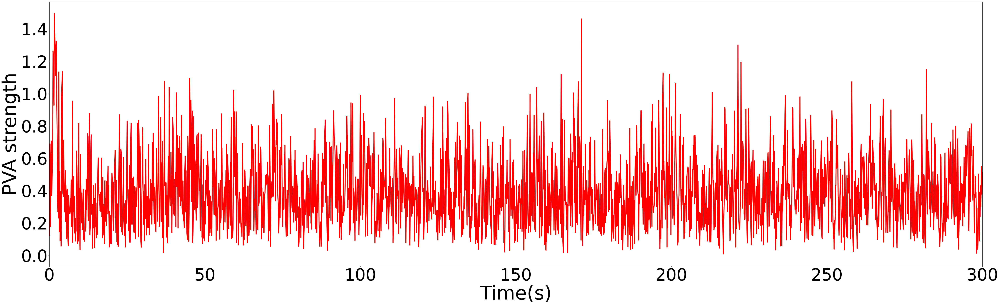

In [43]:
plt.figure(figsize= (70,20))
plt.plot(time_array_imaging,PVA_strength_normalized,color = 'r',linewidth =4)
plt.xlabel('Time(s)', fontsize=80)
plt.xticks(fontsize=70)
plt.yticks(fontsize=70)
plt.xlim(0,volume_cycle*volume_time)
plt.ylabel('PVA strength', fontsize=80)
plt.show()

In [44]:
np.mean(PVA_strength_normalized)

0.39498407828114845

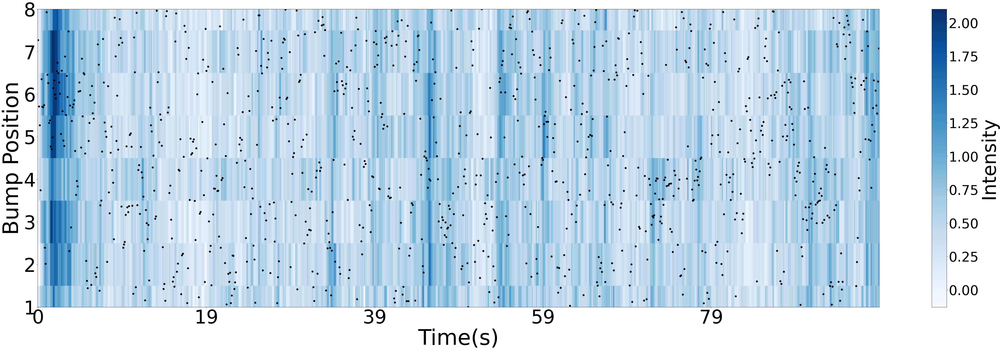

In [45]:
range_start =0
range_end = 1000
a=plt.figure(figsize= (70,20))
img = plt.imshow(df_dff_in_ROI_normalized_shifted_for_plotting_part[:,range_start:range_end], aspect= 'auto', interpolation = 'none', cmap = 'Blues')
plt.xlabel('Time(s)', fontsize=80)
plt.ylabel('Bump Position', fontsize=80)
plt.xticks(ticks=plt.xticks()[0][0:], labels=np.array(plt.xticks()[0][0:]/volume_rate+ range_start*volume_time, dtype=np.int64), fontsize =70)
plt.xticks(ticks=plt.xticks()[0][0:], labels=np.array(plt.xticks()[0][0:]/volume_rate, dtype=np.int64), fontsize =70)
plt.yticks(ticks=plt.yticks()[0][0:], labels=np.array(plt.yticks()[0][0:]+1, dtype=np.int64), fontsize=70)
plt.scatter(np.arange(len(PVA_angle_Array_normalized[range_start:range_end])),7*(PVA_angle_Array_normalized[range_start:range_end]+180)/2/180, color ='black', s = 40)
plt.ylim(0,7)
plt.locator_params(axis ='x',nbins = 20)


cbar = plt.colorbar(img)
cbar.set_label('Intensity',fontsize = 70)
cbar.ax.tick_params(labelsize = 50)

plt.show()

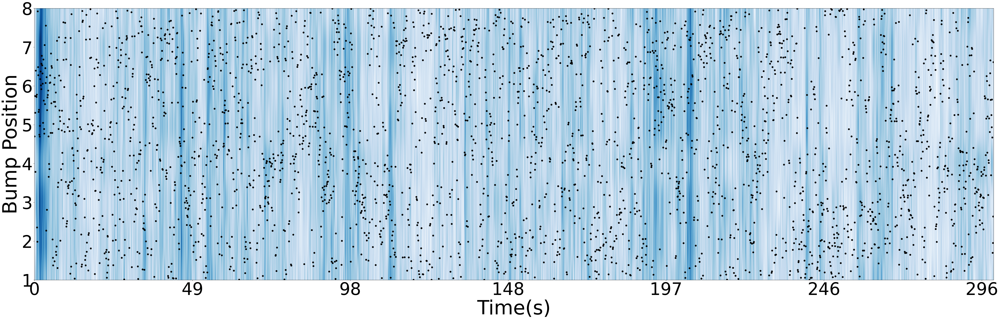

In [46]:
#Plot heatmap of signals in combined ROI and superimpose with PVA
Z_score_array_8_roi = Z_score_array_8_roi.transpose()
Z_score_array_8_roi_shifted = np.zeros((np.size(df_dff_in_ROI_normalized,0),np.size(df_dff_in_ROI_normalized,1)))
Z_score_array_8_roi_shifted[0,:] = Z_score_array_8_roi[4,:]
Z_score_array_8_roi_shifted[1,:] = Z_score_array_8_roi[5,:]
Z_score_array_8_roi_shifted[2,:] = Z_score_array_8_roi[6,:]
Z_score_array_8_roi_shifted[3,:] = Z_score_array_8_roi[7,:] 
Z_score_array_8_roi_shifted[4,:] = Z_score_array_8_roi[0,:] 
Z_score_array_8_roi_shifted[5,:] = Z_score_array_8_roi[1,:] 
Z_score_array_8_roi_shifted[6,:] = Z_score_array_8_roi[2,:] 
Z_score_array_8_roi_shifted[7,:] = Z_score_array_8_roi[3,:]
Z_score_array_8_roi_shifted = pd.DataFrame(Z_score_array_8_roi_shifted)
plt.figure(figsize= (70,20))
plt.imshow(Z_score_array_8_roi_shifted, aspect= 'auto', cmap = 'Blues')
plt.xlabel('Time(s)', fontsize=80)
plt.ylabel('Bump Position', fontsize=80)
plt.xticks(ticks=plt.xticks()[0][0:], labels=np.array(plt.xticks()[0][0:]/volume_rate, dtype=np.int64), fontsize =70)
plt.yticks(ticks=plt.yticks()[0][0:], labels=np.array(plt.yticks()[0][0:]+1, dtype=np.int64), fontsize=70)
plt.ylim(0,7)
plt.locator_params(axis ='x',nbins = 20)
plt.scatter(np.arange(len(PVA_angle_array_z)),7*(PVA_angle_array_z+180)/2/180, color ='black', s = 40)
plt.show()

In [47]:
Z_score_array_8_roi = Z_score_array_8_roi.transpose()

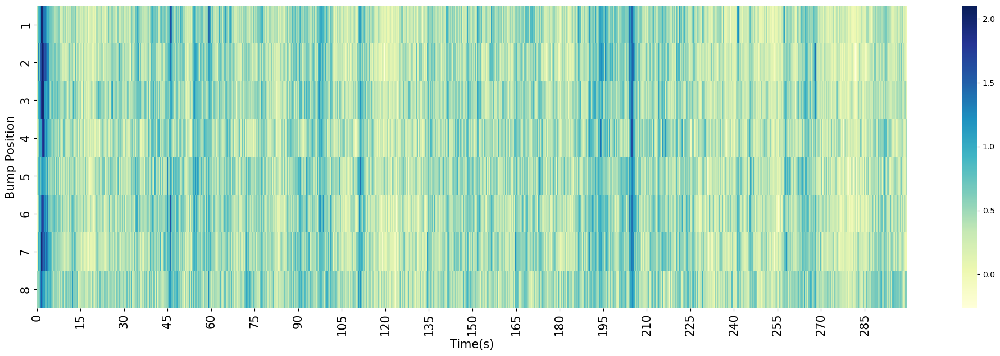

In [48]:
#Plot uncombined 16/8 ROi all together
plt.figure(figsize= (25,7))
time_array_imaging_round = np.round_(time_array_imaging, decimals =0)
p16 = sns.heatmap(dF_F_array_normalized.transpose(),cmap='YlGnBu', xticklabels = time_array_imaging_round)
sns.color_palette("light:b", as_cmap=True)
plt.xticks(ticks=plt.xticks()[0][0:], labels=np.array(plt.xticks()[0][0:]/volume_rate, dtype=np.int64), fontsize =15)
plt.yticks(ticks=plt.yticks()[0][0:], labels=np.array(plt.yticks()[0][0:]+1, dtype=np.int64), fontsize=15)
plt.locator_params(axis ='x',nbins = 20)
plt.xlabel('Time(s)', fontsize=15)
plt.ylabel('Bump Position', fontsize=15)
plt.show()

In [49]:
#Plot uncombined 16/8 ROi all together
if dual_imaging == 1:
    plt.figure(figsize= (25,7))
    time_array_imaging_round = np.round_(time_array_imaging, decimals =0)
    p16 = sns.heatmap(dF_F_array_normalized_2.transpose(),cmap='YlGnBu', xticklabels = time_array_imaging_round)
    sns.color_palette("light:b", as_cmap=True)
    plt.xticks(ticks=plt.xticks()[0][0:], labels=np.array(plt.xticks()[0][0:]/volume_rate, dtype=np.int64), fontsize =15)
    plt.yticks(ticks=plt.yticks()[0][0:], labels=np.array(plt.yticks()[0][0:]+1, dtype=np.int64), fontsize=15)
    plt.locator_params(axis ='x',nbins = 20)
    plt.xlabel('Time(s)', fontsize=15)
    plt.ylabel('Bump Position', fontsize=15)
    plt.show()

In [50]:
voltage_recording = pd.read_csv('/home/tianhaoqiu/Desktop/TQfly432-003/TQfly432-003_Cycle00001_VoltageRecording_001.csv')

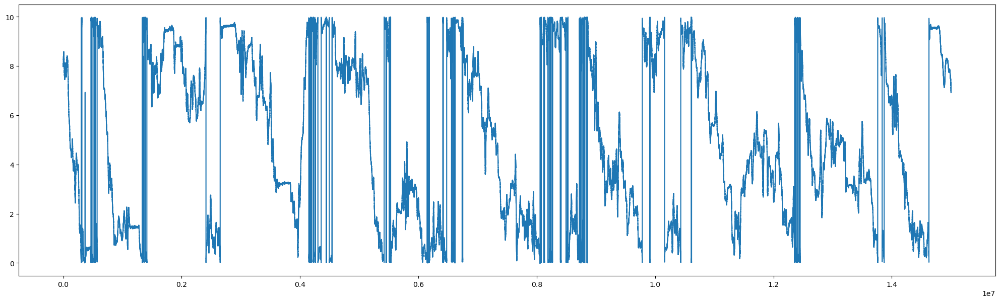

In [51]:
#Input4 = Heading, Input6 =x , Input7 =y
voltage_recording_heading = voltage_recording[' Heading']
plt.figure(figsize= (25,7))
plt.plot(voltage_recording[' Heading'])

In [52]:
#Read the fictrac raw .dat file and trial start/end info from Bruker
fictrac_data = pd.read_table('/home/tianhaoqiu/Desktop/Fictrac/TQfly432-07282024/fictrac-20240728_144534.dat', sep =',', header = None, names = ['frame counter', 'delta rotation vector x (cam)', 'delta rotation vector y (cam)','delta rotation vector z (cam)','delta rotation over score', 'delta rotaion vector 1 (lab)','delta rotaion vector 2 (lab)', 'delta rotaion vector 3 (lab)', 'absolute rotation vector 1 (cam)','absolute rotation vector 2 (cam)','absolute rotation vector 3 (cam)','absolute rotation vector 1 (lab)','absolute rotation vector 2 (lab)','absolute rotation vector 3 (lab)','integrated x', 'integrated y','integrated heading','animal movement direcrtion','animal movement speed', 'integrated forward motion','integrated side motion','timestamp','sequence counter','delta timestamp','alt.timestamp'] )
fictrac_data

,frame counter,delta rotation vector x (cam),delta rotation vector y (cam),delta rotation vector z (cam),delta rotation over score,delta rotaion vector 1 (lab),delta rotaion vector 2 (lab),delta rotaion vector 3 (lab),absolute rotation vector 1 (cam),absolute rotation vector 2 (cam),...,integrated y,integrated heading,animal movement direcrtion,animal movement speed,integrated forward motion,integrated side motion,timestamp,sequence counter,delta timestamp,alt.timestamp
0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,6.482472e+15,0,0,5.313496e+07
1,1,-0.000747,-0.000369,0.000553,4173.841429,0.000844,-0.000328,-0.000425,-0.000747,-0.000369,...,-0.000844,0.000425,4.342177,0.000905,-0.000328,-0.000844,6.482472e+15,1,2126221,5.313497e+07
2,2,-0.000522,0.000285,0.001270,4269.964529,0.001364,0.000281,0.000168,-0.001269,-0.000084,...,-0.002208,0.000257,4.915916,0.001393,-0.000046,-0.002208,6.482472e+15,2,2126221,5.313497e+07
3,3,-0.000574,-0.000101,0.000248,4059.520000,0.000516,-0.000343,-0.000130,-0.001844,-0.000184,...,-0.002724,0.000387,4.125601,0.000620,-0.000389,-0.002724,6.482472e+15,3,2126017,5.313497e+07
4,4,-0.000571,-0.000069,0.000342,3899.416321,0.000595,-0.000287,-0.000105,-0.002414,-0.000253,...,-0.003320,0.000492,4.263503,0.000661,-0.000676,-0.003320,6.482472e+15,4,2125854,5.313497e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1020922,1020948,0.000055,0.009022,-0.000054,4053.048780,0.000636,0.000343,0.008994,3.002086,0.164013,...,21.195190,3.257771,5.207817,0.000722,73.148244,58.889065,6.484773e+15,1020948,2125407,5.530866e+07
1020923,1020949,-0.000553,0.013760,0.008661,4141.158537,0.008558,0.004847,0.012958,3.002023,0.178439,...,21.203166,3.244813,5.227713,0.009836,73.153091,58.880506,6.484773e+15,1020949,2126425,5.530866e+07
1020924,1020950,-0.000495,0.013028,0.021019,4053.048780,0.018693,0.011729,0.011171,3.000713,0.211337,...,21.220626,3.233642,5.272756,0.022068,73.164820,58.861814,6.484773e+15,1020950,2125651,5.530867e+07
1020925,1020951,-0.001095,0.016782,0.014614,4317.378049,0.014023,0.007812,0.015451,2.999319,0.234967,...,21.233942,3.218191,5.220624,0.016052,73.172632,58.847790,6.484773e+15,1020951,2126383,5.530867e+07


In [53]:
with open('/home/tianhaoqiu/Desktop/Fictrac/TQfly432-07282024/TQfly432_scan2.pkl', 'rb') as f:
    fictracinfo = pickle.load(f)
fictracinfo

{'start': [871914],
 'opto': [],
 'abort': [1017135],
 'start_trig_falling_edge': []}

In [54]:
#This for all fly before TQfly235
#start_frame_index = fictracinfo['start_trig_falling_edge'][0] - 1
start_frame_index = fictracinfo['start'][0] - 1
abort_frame_index = fictracinfo['abort'][0]

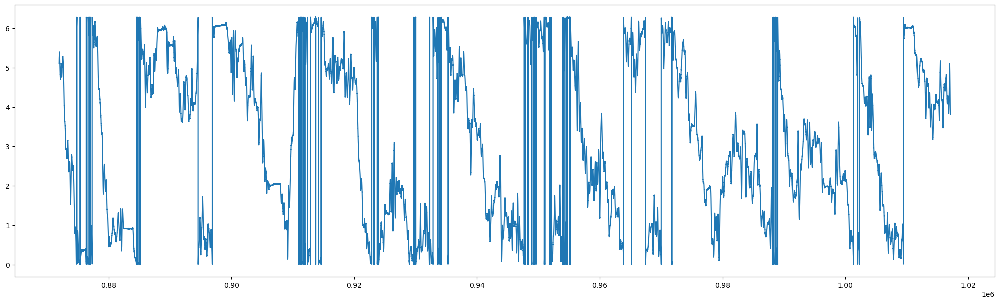

In [55]:
# the scanning start actually one frame before the falling_edge
fictrac_heading = fictrac_data['integrated heading']
fictrac_integrated_x = fictrac_data['integrated x']
fictrac_integrated_y = fictrac_data['integrated y']
plt.figure(figsize= (25,7))
plt.plot(fictrac_heading[start_frame_index:abort_frame_index ])

In [56]:
#change it to binary
fictrac_frame_proc = voltage_recording[' FicTrac Frame Proc.']
pinn_signal = np.zeros(len(fictrac_frame_proc))
for i in range(len(fictrac_frame_proc)):
    if fictrac_frame_proc[i] < 1:
        pinn_signal[i] = 0
    else:
        pinn_signal[i] = 1


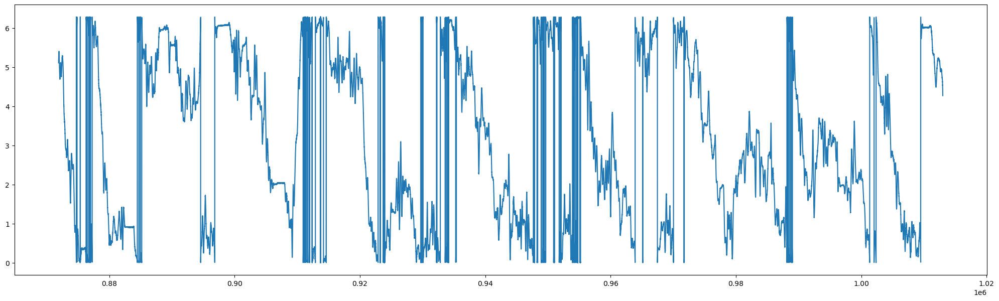

In [57]:
#find every time pinn value is up to 1(locked to each scanning frame)
up_index = np.argwhere(np.diff(pinn_signal)==1)
plt.figure(figsize= (25,7))
plt.plot(fictrac_heading[start_frame_index:start_frame_index+len(up_index)])
#fictrac_heading[start_frame_index:start_frame_index+len(up_index)].shape
plt.show()

In [58]:
behavior_sampling_rate =int(np.ceil(len(up_index)/(volume_cycle*volume_time)))

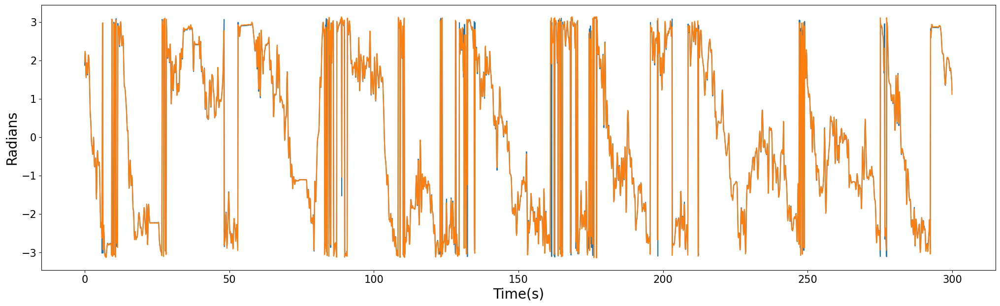

In [59]:
heading_array = voltage_recording [' Heading']
time_array_initial_fictrac = np.arange(len(heading_array))/fictrack_sampling_rate
head_array_filtered = low_pass_filter_TQ(heading_array, 100 ,fictrack_sampling_rate)
head_array_filtered = low_pass_filter_TQ(head_array_filtered, 100 ,fictrack_sampling_rate)
head_array_downsampled = downsample_heading_to_total_volume(volume_cycle, head_array_filtered)

test = fictrac_heading[start_frame_index:start_frame_index+len(up_index)]
test_filtered = low_pass_filter_TQ(test, 100 ,behavior_sampling_rate)
test_filtered = low_pass_filter_TQ(test_filtered, 100 ,behavior_sampling_rate)
test_filtered_downsampled = downsample_heading_to_total_volume(volume_cycle, test_filtered)

plt.figure(figsize= (25,7))
plt.plot(time_array_imaging,head_array_downsampled*np.pi*2/10-np.pi)
#plt.plot(time_array_imaging,test_filtered_downsampled-np.pi)
plt.plot(time_array_imaging,test_filtered_downsampled-np.pi)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel('Time(s)', fontsize=20)
plt.ylabel('Radians', fontsize=20)
plt.show()

In [60]:
import statsmodels.api as sm
correlate_array_fictrac_voltageRecording= np.zeros(10000)
for i in range(len(correlate_array_fictrac_voltageRecording)):
    test_fictrac_behavior = fictrac_heading[start_frame_index-i:start_frame_index-i+len(up_index)]
    test_fictrac_behavior = low_pass_filter_TQ(test_fictrac_behavior, 100 ,behavior_sampling_rate)
    test_fictrac_behavior= low_pass_filter_TQ(test_fictrac_behavior, 100 ,behavior_sampling_rate)
    test_fictrac_behavior = downsample_heading_to_total_volume(volume_cycle, test_fictrac_behavior)
    correlate_array_fictrac_voltageRecording[i] = np.correlate(test_fictrac_behavior-np.pi,head_array_downsampled*np.pi*2/10-np.pi)
np.argwhere(correlate_array_fictrac_voltageRecording==np.max(correlate_array_fictrac_voltageRecording))

array([[10]])

In [61]:
corrected_frame =  np.argwhere(correlate_array_fictrac_voltageRecording==np.max(correlate_array_fictrac_voltageRecording))[0][0]
corrected_frame = 10
start_frame_index_corrected = start_frame_index - corrected_frame

In [62]:
corrected_frame 

10

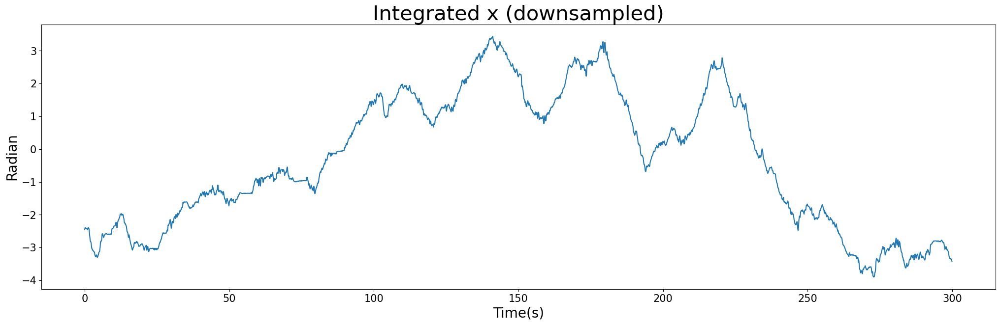

In [63]:
fictrac_integrated_x_filtered = low_pass_filter_TQ(fictrac_integrated_x[start_frame_index_corrected :start_frame_index_corrected +len(up_index)],100,behavior_sampling_rate)
fictrac_integrated_x_filtered = low_pass_filter_TQ(fictrac_integrated_x_filtered ,100,behavior_sampling_rate)
fictrac_integrated_x_filtered_downsampled = downsample_heading_to_total_volume(volume_cycle, fictrac_integrated_x_filtered)
fictrac_integrated_y_filtered = low_pass_filter_TQ(fictrac_integrated_y[start_frame_index_corrected :start_frame_index_corrected +len(up_index)],100,behavior_sampling_rate)
fictrac_integrated_y_filtered = low_pass_filter_TQ(fictrac_integrated_y_filtered ,100,behavior_sampling_rate)
fictrac_integrated_y_filtered_downsampled = downsample_heading_to_total_volume(volume_cycle, fictrac_integrated_y_filtered)
plt.figure(figsize= (25,7))
plt.plot(time_array_imaging,fictrac_integrated_x_filtered_downsampled)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel('Time(s)', fontsize=20)
plt.ylabel('Radian', fontsize=20)
plt.title('Integrated x (downsampled)', fontsize =30)
plt.show()

In [64]:
fictrac_heading_corrected = fictrac_heading[start_frame_index_corrected :start_frame_index_corrected +len(up_index)]
fictrac_heading_corrected_filtered = low_pass_filter_TQ(fictrac_heading_corrected, 100 ,behavior_sampling_rate)
fictrac_heading_corrected_filtered = low_pass_filter_TQ(fictrac_heading_corrected_filtered, 100 ,behavior_sampling_rate)
fictrac_heading_corrected_filtered_downsampled = downsample_heading_to_total_volume(volume_cycle, fictrac_heading_corrected_filtered)

In [65]:
#[0:500]

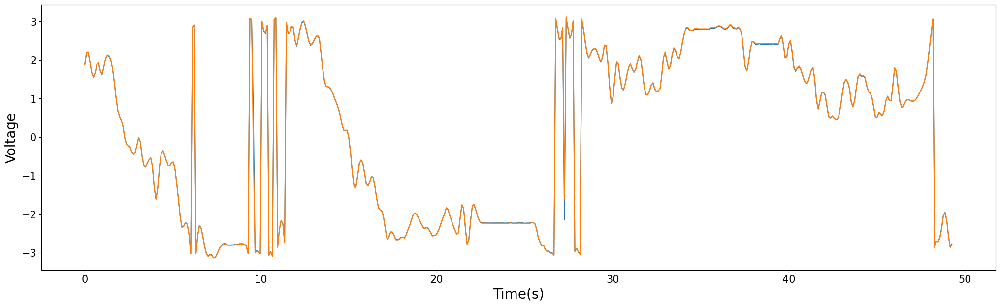

In [66]:
plt.figure(figsize= (25,7))
plt.plot(time_array_imaging[0:500],(head_array_downsampled*np.pi*2/10-np.pi)[0:500])
plt.plot(time_array_imaging[0:500],(fictrac_heading_corrected_filtered_downsampled-np.pi)[0:500])
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel('Time(s)', fontsize=20)
plt.ylabel('Voltage', fontsize=20)
plt.show()

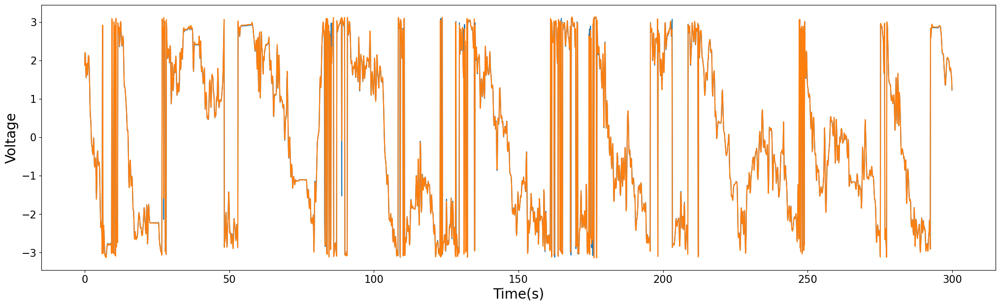

In [67]:
plt.figure(figsize= (25,7))
plt.plot(time_array_imaging,(head_array_downsampled*np.pi*2/10-np.pi))
plt.plot(time_array_imaging,(fictrac_heading_corrected_filtered_downsampled-np.pi))
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel('Time(s)', fontsize=20)
plt.ylabel('Voltage', fontsize=20)
plt.show()

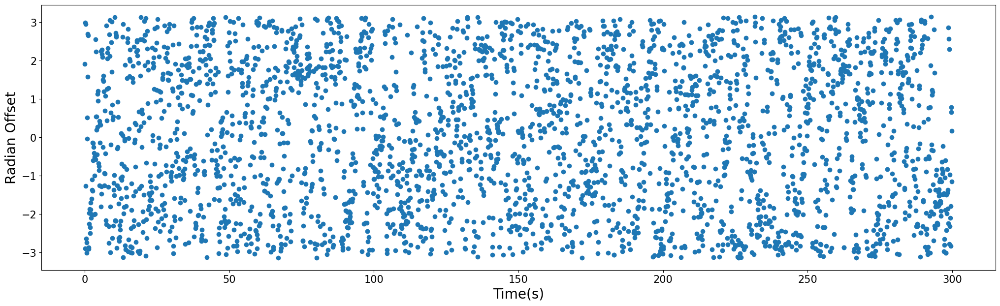

In [68]:
#0-10V equivalent to -pi to pi
#head_array_downsampled_wrapped = head_array_downsampled * np.pi*2/10 - np.pi
head_array_downsampled_wrapped = fictrac_heading_corrected_filtered_downsampled -np.pi

barPosition_array_downsampled_wrapped = -head_array_downsampled_wrapped
radian_offset = offset_calculation(barPosition_array_downsampled_wrapped, PVA_radian_array, IfRadian = True)
radian_offset_normalized = offset_calculation(barPosition_array_downsampled_wrapped, PVA_radian_array_normalized, IfRadian = True)
plt.figure(figsize= (25,7))
plt.scatter(time_array_imaging,radian_offset_normalized)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel('Time(s)', fontsize=20)
plt.ylabel('Radian Offset', fontsize=20)
plt.show()

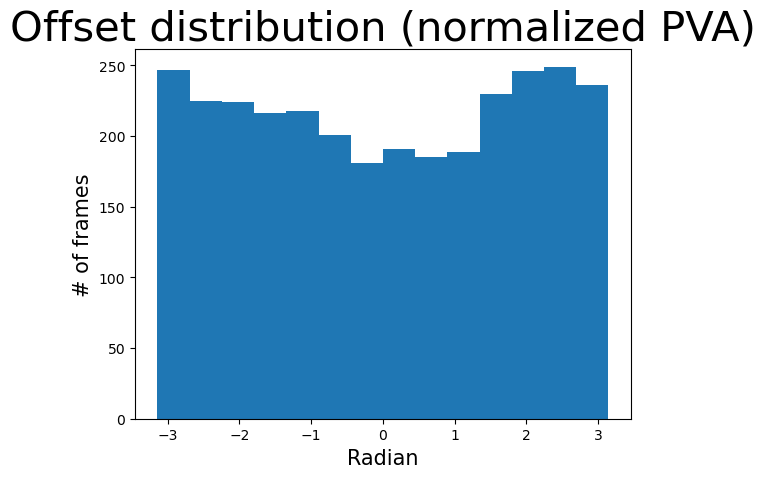

In [69]:
plt.hist(radian_offset_normalized,bins='auto')
plt.title('Offset distribution (normalized PVA)',fontsize=30)
plt.xlabel('Radian',fontsize=15)
plt.ylabel('# of frames',fontsize=15)
plt.show()

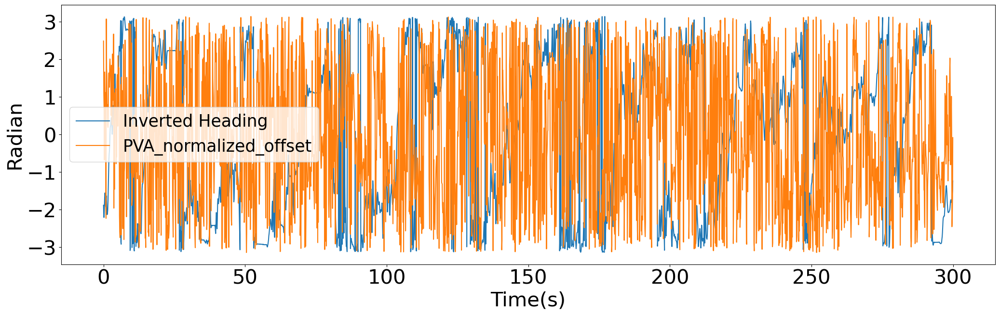

In [70]:
PVA_radian_array_offset =moving_wrapped_plot_by_offset(PVA_radian_array,math.degrees(0), ifRadian =True)
PVA_radian_array_normalized_offset =moving_wrapped_plot_by_offset(PVA_radian_array_normalized,math.degrees(0), ifRadian =True)
plt.figure(figsize= (25,7))
plt.plot(time_array_imaging,barPosition_array_downsampled_wrapped)
plt.plot(time_array_imaging,PVA_radian_array_normalized_offset)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
plt.xlabel('Time(s)', fontsize=30)
plt.ylabel('Radian', fontsize=30)
if trial_type == 0:
    plt.legend(['Inverted Heading','PVA_normalized_offset'],fontsize=25)
else:
    plt.legend(['Bar Position','PVA_normalized_offset'],fontsize=25)
plt.show()

In [71]:
max_Voltage = 10
heading_array_processed = fictrack_signal_decoding(barPosition_array_downsampled_wrapped, time_array_imaging, max_Voltage, already_radian = True)
PVA_unwrapped = fictrack_signal_decoding(PVA_radian_array_offset, time_array_imaging, max_voltage = 10, already_radian = True)
PVA_unwrapped_normalized = fictrack_signal_decoding(PVA_radian_array_normalized, time_array_imaging, max_voltage = 10, already_radian = True)
if dual_imaging == 1:
    PVA_unwrapped_normalized_2 = fictrack_signal_decoding(PVA_radian_array_normalized_2, time_array_imaging, max_voltage = 10, already_radian = True)

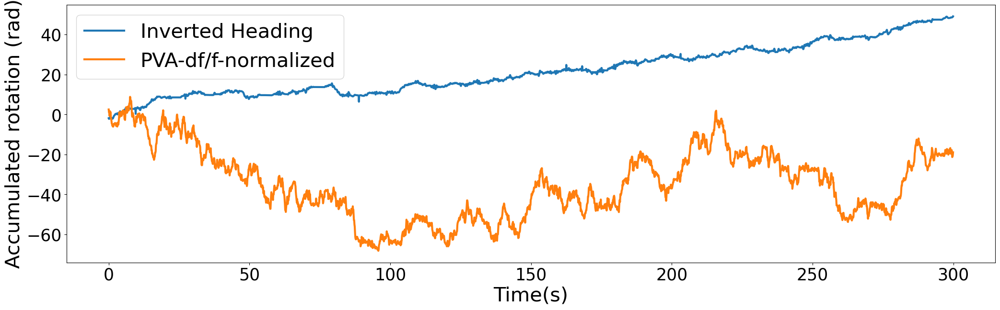

In [72]:
#head_array_downsampled = downsample_heading_to_total_volume(volume_cycle, heading_array_processed)
plt.figure(figsize= (25,7))
plt.plot(time_array_imaging,heading_array_processed,linewidth =3)
plt.plot(time_array_imaging, PVA_unwrapped_normalized,linewidth =3)
plt.xlabel('Time(s)', fontsize=30)
plt.ylabel('Accumulated rotation (rad)', fontsize=30)
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
if trial_type == 0:
    plt.legend(['Inverted Heading','PVA-df/f-normalized'],fontsize=30)
else:
    plt.legend(['Bar Position','PVA-df/f-normalized'],fontsize=30)
plt.show()

In [73]:
#Create a dataframe to contain all different ways calculating unwrapped PVA and/or amplitudes
all_pva_data = pd.DataFrame()
all_pva_data['Heading'] = heading_array_processed 
all_pva_data['PVA_radian_dff'] = PVA_unwrapped 
all_pva_data['PVA_radian_dff_normalized'] = PVA_unwrapped_normalized
#all_pva_data['PVA_radian_dff_sgfiltered'] = PVA_unwrapped_sgfiltered
#all_pva_data['PVA_radian_dff_left_only'] = PVA_unwrapped_dff_left_only
#all_pva_data['PVA_radian_dff_right_only'] =  PVA_unwrapped_dff_right_only
#all_pva_data['PVA_radian_z'] = PVA_unwrapped_z
#all_pva_data['PVA_radian_z_left_only'] = PVA_unwrapped_z_left_only 
#all_pva_data['PVA_radian_z_right_only'] = PVA_unwrapped_z_right_only 
all_pva_data['Bump_amplitude'] = bump_amplitude_dff
#all_pva_data['Bump_amplitude_left_only'] = bump_amplitude_dff_left_only
#all_pva_data['Bump_amplitude_right_only'] = bump_amplitude_dff_right_only
all_pva_data['Heading_velocity'] = np.gradient(heading_array_processed)/volume_time
all_pva_data['PVA_dff_velocity'] = np.gradient(all_pva_data['PVA_radian_dff'])/volume_time
#all_pva_data['PVA_dff_velocity_sgfiltered'] = np.gradient(all_pva_data['PVA_radian_dff_sgfiltered'])/volume_time
#all_pva_data['PVA_dff_left_only_velocity'] = np.gradient(all_pva_data['PVA_radian_dff_left_only'])/volume_time
#all_pva_data['PVA_dff_right_only_velocity'] = np.gradient(all_pva_data['PVA_radian_dff_right_only'])/volume_time
#all_pva_data['PVA_z_velocity'] = np.gradient(all_pva_data['PVA_radian_z'])
#all_pva_data['PVA_z_left_only_velocity'] = np.gradient(all_pva_data['PVA_radian_z_left_only'])
#all_pva_data['PVA_z_right_only_velocity'] = np.gradient(all_pva_data['PVA_radian_z_right_only'])
all_pva_data

,Heading,PVA_radian_dff,PVA_radian_dff_normalized,Bump_amplitude,Heading_velocity,PVA_dff_velocity
0,-1.881804,-0.480098,2.487719,0.483778,-3.270873,-29.593797
1,-2.204803,-3.402486,1.089036,0.345829,-1.638994,-23.897803
2,-2.205505,-5.199914,0.690686,0.607434,1.320353,-21.598058
3,-1.944033,-7.668102,-0.677790,0.879435,2.693855,-24.693841
4,-1.673469,-10.076948,1.662017,1.038332,1.961625,-13.451380
...,...,...,...,...,...,...
3033,48.501411,15.196810,-18.816538,1.132153,0.684227,12.657769
3034,48.590967,15.544629,-21.303909,0.709948,0.892392,7.537517
3035,48.677659,16.685469,-21.094569,0.705732,0.887327,1.580982
3036,48.766214,15.856873,-20.520052,1.008348,1.781508,-14.572060


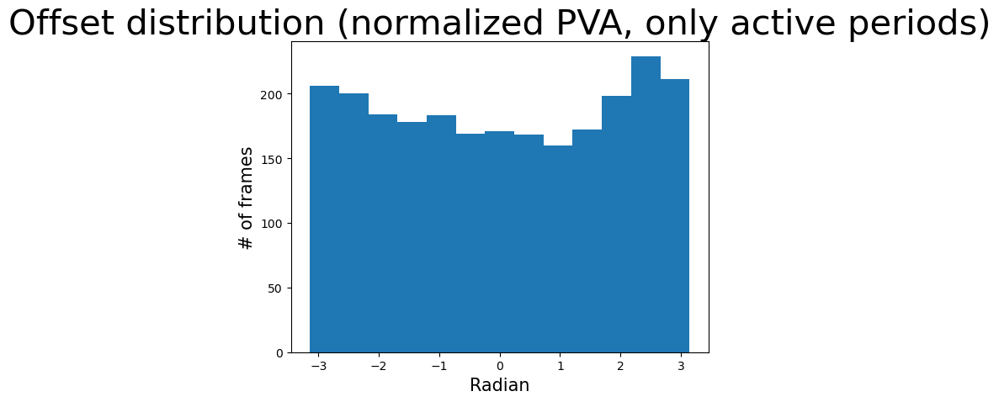

In [74]:
# Bump offset excluding low velocity point
radian_offset_no_stopping_period_normalized = []
for i in range(len(heading_array_processed)):
    if np.abs(all_pva_data['Heading_velocity'] [i]) >= 0.26:
        radian_offset_no_stopping_period_normalized.append(radian_offset_normalized[i])
plt.hist(radian_offset_no_stopping_period_normalized,bins='auto')
plt.title('Offset distribution (normalized PVA, only active periods)',fontsize=30)
plt.xlabel('Radian',fontsize=15)
plt.ylabel('# of frames',fontsize=15)
plt.show()

In [75]:
#Calculate velocity and generate correlation matrix of PVA and Heading
def calculate_PVA_heading_velocity_corr(heading_array, PVA_array, volume_time, bump_amplitude):
    heading_velocity = np.gradient(heading_array)/volume_time
    PVA_velocity = np.gradient(PVA_array)/volume_time
    
    abnormal_velocity = np.argwhere(np.absolute(PVA_velocity) > 8.72)
    while (len(abnormal_velocity ) > 0):
        PVA_velocity[abnormal_velocity ] = PVA_velocity[abnormal_velocity -1]
        abnormal_velocity = np.argwhere(np.absolute(PVA_velocity) > 8.72)
    
    abnormal_velocity = np.argwhere(np.absolute(heading_velocity) > 8.72)
    while (len(abnormal_velocity ) > 0):
        heading_velocity[abnormal_velocity ] = heading_velocity[abnormal_velocity -1]
        abnormal_velocity = np.argwhere(np.absolute(heading_velocity) > 8.72)
    
    velocity_corr_array = np.zeros([heading_array.size, 3])
    velocity_corr_array[:,0]=heading_velocity
    velocity_corr_array[:,1]=PVA_velocity
    #gaussian_window = signal.windows.gaussian(5,0.6)
    #velocity_corr_array[:,0]= np.convolve (velocity_corr_array[:,0], gaussian_window, mode = 'same')
    #velocity_corr_array[:,1]= np.convolve (velocity_corr_array[:,1], gaussian_window, mode = 'same')
    velocity_corr_array[:,2]=bump_amplitude
    
    import seaborn as sns
    import pandas as pd
    df = pd.DataFrame(velocity_corr_array, columns = ['Turning Velocity', 'PVA Velocity', 'PVA Amplitude_green'])
    #sns.scatterplot(data = df, x='Turning Velocity', y='PVA Velocity')
    #plt.xlabel('Turning Velocity (Rad/Sec)', fontsize = 10)
    #plt.ylabel('PVA Velocity (Rad/Sec)', fontsize = 10)    
    return df['PVA Velocity'], df['Turning Velocity'], df

In [76]:
PVA_vel, Heading_vel, velocity_df = calculate_PVA_heading_velocity_corr(heading_array_processed, PVA_unwrapped, volume_time=volume_time, bump_amplitude= bump_amplitude_dff)
PVA_vel_normalized, Heading_vel, velocity_df = calculate_PVA_heading_velocity_corr(heading_array_processed, PVA_unwrapped_normalized, volume_time=volume_time, bump_amplitude= bump_amplitude_dff_normalized)
np.corrcoef(PVA_vel_normalized,Heading_vel)[0,1]

0.0487338511711095

In [77]:
Heading_vel = np.gradient(heading_array_processed)/volume_time
ASPEED = np.abs(Heading_vel*180/np.pi)

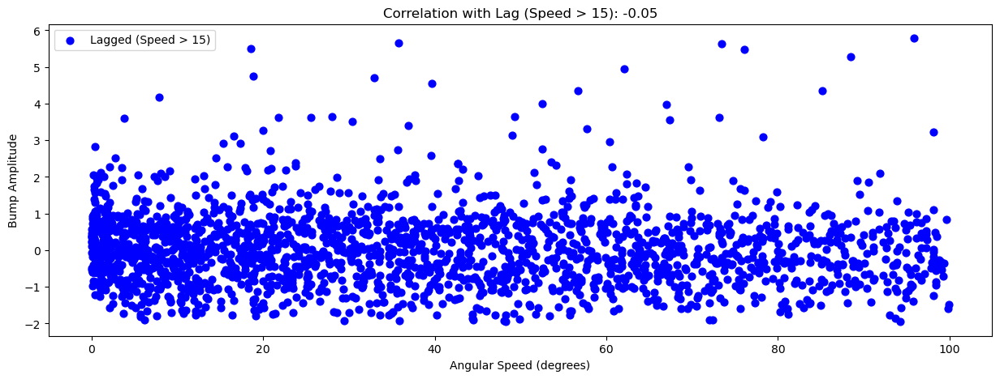

In [81]:
from scipy.signal import correlate
from scipy.stats import zscore
from scipy.signal import correlation_lags
from scipy.signal import correlate
Bump_amplitude_smooth_for_speed_cor = gaussian_filter1d(np.squeeze(F_array), sigma =6)
Bump_amplitude_z_smooth_for_speed_cor = zscore(Bump_amplitude_smooth_for_speed_cor)


# Calculate cross-correlation within the allowed lags range
cross_corr = correlate(ASPEED, Bump_amplitude_z_smooth_for_speed_cor, mode='full')
lags = correlation_lags(ASPEED.size,  Bump_amplitude_z_smooth_for_speed_cor.size, mode="full")
                                  
#find the middle index to consider the frame on both side till max shift frame (1s)
max_shift_frame = int(volume_rate)
middle_index = int(len(lags)/2)
lags_short = lags[(middle_index - max_shift_frame):(middle_index + max_shift_frame + 1) ]
correlation_short = cross_corr[(middle_index - max_shift_frame):(middle_index + max_shift_frame + 1) ]
lag = lags_short[np.argmax(correlation_short)]
if lag > 0:
    lag = lags_short[np.argmax(correlation_short[0:int((len(correlation_short)-1)/2+1)])]
lag = int(-0.4/volume_time)
    
# Apply the lag only to Bump_amplitude_z_smooth_for_speed_cor
    
#shift back tne bump_amplitude by drop the lag frame at the beginning
lagged_Bump_amplitude_z_smooth_for_speed_cor = Bump_amplitude_z_smooth_for_speed_cor[-lag:]
angular_speed_degrees_shifted = ASPEED[:len(lagged_Bump_amplitude_z_smooth_for_speed_cor)]
# Create a mask for data points where Forward_speed_degrees > 15
mask = (angular_speed_degrees_shifted > 0) & (angular_speed_degrees_shifted < 100)

# Apply the mask to both time series
masked_angular_speed = angular_speed_degrees_shifted[mask]
masked_lagged_Bump_amplitude_z_smooth_for_speed_cor = lagged_Bump_amplitude_z_smooth_for_speed_cor[mask]

# Now you can calculate the correlation with lag accounted for and the mask
correlation_coefficient = np.corrcoef(masked_angular_speed, masked_lagged_Bump_amplitude_z_smooth_for_speed_cor)[0, 1]

# Plot the original and lagged time series for visualization
plt.figure(figsize=(15, 5))
plt.scatter(masked_angular_speed, masked_lagged_Bump_amplitude_z_smooth_for_speed_cor, color='blue', s=40, label='Lagged (Speed > 15)')
plt.legend()
plt.xlabel('Angular Speed (degrees)')
plt.ylabel('Bump Amplitude')
plt.title(f'Correlation with Lag (Speed > 15): {correlation_coefficient:.2f}')
plt.show()

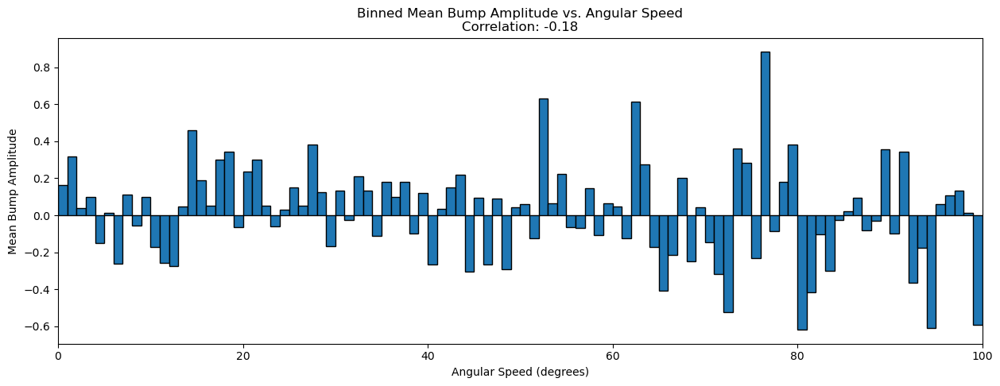

In [82]:
from scipy.stats import binned_statistic

# Define the bin edges with a bin width of 5
bin_width = 1
bin_edges = np.arange(0, 100 + bin_width, bin_width)

# Use scipy's binned_statistic to calculate the mean bump amplitude for each bin
binned_stats = binned_statistic(angular_speed_degrees_shifted, lagged_Bump_amplitude_z_smooth_for_speed_cor, statistic='mean', bins=bin_edges)

# Extract the mean bump amplitude and bin centers
mean_bump_amplitude_per_bin = binned_stats.statistic
bin_centers = binned_stats.bin_edges[:-1] + 0.5 * bin_width

# Exclude bins with no data points
valid_bins = ~np.isnan(mean_bump_amplitude_per_bin)

# Calculate the correlation between mean bump amplitude and bin centers for valid bins
correlation_coefficient = np.corrcoef(bin_centers[valid_bins], mean_bump_amplitude_per_bin[valid_bins])[0, 1]

# Plot the binned mean bump amplitude against the angular speed for valid bins
plt.figure(figsize=(15, 5))
plt.bar(bin_centers[valid_bins], mean_bump_amplitude_per_bin[valid_bins], width=bin_width, align='center', edgecolor='black')
plt.xlim(0, np.max(bin_edges))  # Set the limit for angular speed
plt.xlabel('Angular Speed (degrees)')
plt.ylabel('Mean Bump Amplitude')
plt.title(f'Binned Mean Bump Amplitude vs. Angular Speed\nCorrelation: {correlation_coefficient:.2f}')
plt.show()

In [77]:
PVA_behavior_data_output_normalized = pd.DataFrame()
PVA_behavior_data_output_normalized['Time_Stamp'] = time_array_imaging
PVA_behavior_data_output_normalized['F_Roi_1'] = F_8_roi[:,0]
PVA_behavior_data_output_normalized['F_Roi_2'] = F_8_roi[:,1]
PVA_behavior_data_output_normalized['F_Roi_3'] = F_8_roi[:,2]
PVA_behavior_data_output_normalized['F_Roi_4'] = F_8_roi[:,3]
PVA_behavior_data_output_normalized['F_Roi_5'] = F_8_roi[:,4]
PVA_behavior_data_output_normalized['F_Roi_6'] = F_8_roi[:,5]
PVA_behavior_data_output_normalized['F_Roi_7'] = F_8_roi[:,6]
PVA_behavior_data_output_normalized['F_Roi_8'] = F_8_roi[:,7]
PVA_behavior_data_output_normalized['Raw_F_1'] = F_array[:,0]
PVA_behavior_data_output_normalized['Raw_F_2'] = F_array[:,1]
PVA_behavior_data_output_normalized['Raw_F_3'] = F_array[:,2]
PVA_behavior_data_output_normalized['Raw_F_4'] = F_array[:,3]
PVA_behavior_data_output_normalized['Raw_F_5'] = F_array[:,4]
PVA_behavior_data_output_normalized['Raw_F_6'] = F_array[:,5]
PVA_behavior_data_output_normalized['Raw_F_7'] = F_array[:,6]
PVA_behavior_data_output_normalized['Raw_F_8'] = F_array[:,7]
if ROI_total == 16:
    PVA_behavior_data_output_normalized['Raw_F_9'] = F_array[:,8]
    PVA_behavior_data_output_normalized['Raw_F_10'] = F_array[:,9]
    PVA_behavior_data_output_normalized['Raw_F_11'] = F_array[:,10]
    PVA_behavior_data_output_normalized['Raw_F_12'] = F_array[:,11]
    PVA_behavior_data_output_normalized['Raw_F_13'] = F_array[:,12]
    PVA_behavior_data_output_normalized['Raw_F_14'] = F_array[:,13]
    PVA_behavior_data_output_normalized['Raw_F_15'] = F_array[:,14]
    PVA_behavior_data_output_normalized['Raw_F_16'] = F_array[:,15]
PVA_behavior_data_output_normalized['dFF_Roi_1'] = dF_F_array_8_roi_normalized[:,0]
PVA_behavior_data_output_normalized['dFF_Roi_2'] = dF_F_array_8_roi_normalized[:,1]
PVA_behavior_data_output_normalized['dFF_Roi_3'] = dF_F_array_8_roi_normalized[:,2]
PVA_behavior_data_output_normalized['dFF_Roi_4'] = dF_F_array_8_roi_normalized[:,3]
PVA_behavior_data_output_normalized['dFF_Roi_5'] = dF_F_array_8_roi_normalized[:,4]
PVA_behavior_data_output_normalized['dFF_Roi_6'] = dF_F_array_8_roi_normalized[:,5]
PVA_behavior_data_output_normalized['dFF_Roi_7'] = dF_F_array_8_roi_normalized[:,6]
PVA_behavior_data_output_normalized['dFF_Roi_8'] = dF_F_array_8_roi_normalized[:,7]
PVA_behavior_data_output_normalized['Z_score_Roi_1'] = Z_score_array_8_roi[:,0]
PVA_behavior_data_output_normalized['Z_score_Roi_2'] = Z_score_array_8_roi[:,1]
PVA_behavior_data_output_normalized['Z_score_Roi_3'] = Z_score_array_8_roi[:,2]
PVA_behavior_data_output_normalized['Z_score_Roi_4'] = Z_score_array_8_roi[:,3]
PVA_behavior_data_output_normalized['Z_score_Roi_5'] = Z_score_array_8_roi[:,4]
PVA_behavior_data_output_normalized['Z_score_Roi_6'] = Z_score_array_8_roi[:,5]
PVA_behavior_data_output_normalized['Z_score_Roi_7'] = Z_score_array_8_roi[:,6]
PVA_behavior_data_output_normalized['Z_score_Roi_8'] = Z_score_array_8_roi[:,7]
PVA_behavior_data_output_normalized['PVA_Radian'] = PVA_radian_array_normalized
PVA_behavior_data_output_normalized['PVA_Radian_offset'] = PVA_radian_array_normalized_offset
PVA_behavior_data_output_normalized['PVA_Angle'] = PVA_angle_Array_normalized
PVA_behavior_data_output_normalized['Angular_Velocity'] = Heading_vel
PVA_behavior_data_output_normalized['Bar_Position/Heading'] = barPosition_array_downsampled_wrapped
PVA_behavior_data_output_normalized['Unwrapped_Bar_Position/Heading'] = heading_array_processed
PVA_behavior_data_output_normalized['Unwrapped_Radian'] = PVA_unwrapped_normalized
PVA_behavior_data_output_normalized['Integrated_x'] = fictrac_integrated_x_filtered_downsampled
PVA_behavior_data_output_normalized['Integrated_y'] = fictrac_integrated_y_filtered_downsampled
PVA_behavior_data_output_normalized['PVA_strength'] = PVA_strength_normalized
PVA_behavior_data_output_normalized['Bump_amplitude'] = bump_amplitude_dff_normalized
if bar_jumping == 1:
    PVA_behavior_data_output_normalized['Bar_Position/Heading_jumping_bar'] = head_array_downsampled*np.pi*2/10-np.pi


if dual_imaging == 1:
    PVA_behavior_data_output_normalized['F_Roi_1_red'] = F_8_roi_2[:,0]
    PVA_behavior_data_output_normalized['F_Roi_2_red'] = F_8_roi_2[:,1]
    PVA_behavior_data_output_normalized['F_Roi_3_red'] = F_8_roi_2[:,2]
    PVA_behavior_data_output_normalized['F_Roi_4_red'] = F_8_roi_2[:,3]
    PVA_behavior_data_output_normalized['F_Roi_5_red'] = F_8_roi_2[:,4]
    PVA_behavior_data_output_normalized['F_Roi_6_red'] = F_8_roi_2[:,5]
    PVA_behavior_data_output_normalized['F_Roi_7_red'] = F_8_roi_2[:,6]
    PVA_behavior_data_output_normalized['F_Roi_8_red'] = F_8_roi_2[:,7]
    PVA_behavior_data_output_normalized['Raw_F_1_red'] = F_array_2[:,0]
    PVA_behavior_data_output_normalized['Raw_F_2_red'] = F_array_2[:,1]
    PVA_behavior_data_output_normalized['Raw_F_3_red'] = F_array_2[:,2]
    PVA_behavior_data_output_normalized['Raw_F_4_red'] = F_array_2[:,3]
    PVA_behavior_data_output_normalized['Raw_F_5_red'] = F_array_2[:,4]
    PVA_behavior_data_output_normalized['Raw_F_6_red'] = F_array_2[:,5]
    PVA_behavior_data_output_normalized['Raw_F_7_red'] = F_array_2[:,6]
    PVA_behavior_data_output_normalized['Raw_F_8_red'] = F_array_2[:,7]
    if ROI_total == 16:
        PVA_behavior_data_output_normalized['Raw_F_9_red'] = F_array_2[:,8]
        PVA_behavior_data_output_normalized['Raw_F_10_red'] = F_array_2[:,9]
        PVA_behavior_data_output_normalized['Raw_F_11_red'] = F_array_2[:,10]
        PVA_behavior_data_output_normalized['Raw_F_12_red'] = F_array_2[:,11]
        PVA_behavior_data_output_normalized['Raw_F_13_red'] = F_array_2[:,12]
        PVA_behavior_data_output_normalized['Raw_F_14_red'] = F_array_2[:,13]
        PVA_behavior_data_output_normalized['Raw_F_15_red'] = F_array_2[:,14]
        PVA_behavior_data_output_normalized['Raw_F_16_red'] = F_array_2[:,15]
    PVA_behavior_data_output_normalized['dFF_Roi_1_red'] = dF_F_array_8_roi_normalized_2[:,0]
    PVA_behavior_data_output_normalized['dFF_Roi_2_red'] = dF_F_array_8_roi_normalized_2[:,1]
    PVA_behavior_data_output_normalized['dFF_Roi_3_red'] = dF_F_array_8_roi_normalized_2[:,2]
    PVA_behavior_data_output_normalized['dFF_Roi_4_red'] = dF_F_array_8_roi_normalized_2[:,3]
    PVA_behavior_data_output_normalized['dFF_Roi_5_red'] = dF_F_array_8_roi_normalized_2[:,4]
    PVA_behavior_data_output_normalized['dFF_Roi_6_red'] = dF_F_array_8_roi_normalized_2[:,5]
    PVA_behavior_data_output_normalized['dFF_Roi_7_red'] = dF_F_array_8_roi_normalized_2[:,6]
    PVA_behavior_data_output_normalized['dFF_Roi_8_red'] = dF_F_array_8_roi_normalized_2[:,7]
    PVA_behavior_data_output_normalized['Z_score_Roi_1_red'] = Z_score_array_8_roi_2[:,0]
    PVA_behavior_data_output_normalized['Z_score_Roi_2_red'] = Z_score_array_8_roi_2[:,1]
    PVA_behavior_data_output_normalized['Z_score_Roi_3_red'] = Z_score_array_8_roi_2[:,2]
    PVA_behavior_data_output_normalized['Z_score_Roi_4_red'] = Z_score_array_8_roi_2[:,3]
    PVA_behavior_data_output_normalized['Z_score_Roi_5_red'] = Z_score_array_8_roi_2[:,4]
    PVA_behavior_data_output_normalized['Z_score_Roi_6_red'] = Z_score_array_8_roi_2[:,5]
    PVA_behavior_data_output_normalized['Z_score_Roi_7_red'] = Z_score_array_8_roi_2[:,6]
    PVA_behavior_data_output_normalized['Z_score_Roi_8_red'] = Z_score_array_8_roi_2[:,7]
    PVA_behavior_data_output_normalized['PVA_Radian_red'] = PVA_radian_array_normalized_2
    PVA_behavior_data_output_normalized['PVA_Angle_red'] = PVA_angle_Array_normalized_2
    PVA_behavior_data_output_normalized['Unwrapped_Radian_red'] = PVA_unwrapped_normalized_2
    PVA_behavior_data_output_normalized['PVA_strength_red'] = PVA_strength_normalized_2
    PVA_behavior_data_output_normalized['Bump_amplitude_red'] = bump_amplitude_dff_normalized_2

In [78]:
PVA_behavior_data_output_normalized.to_csv('/home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/delta7_shi_imaging/delta7_6f_shi/R55G08_6f_+/TQfly425-004-imaging-normalized.csv',encoding = 'utf-8', index=False)